In [1]:
# Import packages

import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pyart
import glob
import matplotlib.patheffects as path_effects
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from pyproj import Transformer
import radlib
import os
import h5py
import matplotlib.dates as mdates
from scipy.ndimage import gaussian_filter1d
from cartopy.feature import NaturalEarthFeature
import xmltodict, geopandas, geojson, xml #xml and json do not exist
from datetime import datetime, timedelta, timezone
import geopy.distance
from datetime import datetime, timedelta
import numpy.matlib as npm
import copy
from scipy.signal import convolve2d
from astropy.convolution import convolve
import scipy.ndimage as ndi
import re
from skimage.draw import polygon

from pprint import pprint
from pysteps import io, motion, rcparams
from pysteps.utils import conversion, transformation
from pysteps.visualization import plot_precip_field, quiver

import json

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

import polars as pl

import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

import geopandas as gpd
from shapely.geometry import Point

from mpl_toolkits.mplot3d import Axes3D

from shapely.geometry import Polygon


from geopandas import GeoDataFrame
import datetime

import matplotlib.patches as patches

import geojson as gs


os.environ["library_metranet_path"] = "/store_new/mch/msrad/idl/lib/radlib4/" # needed for pyradlib
os.environ["METRANETLIB_PATH"] = "/store_new/mch/msrad/idl/lib/radlib4/" # needed for pyart_mch



KeyboardInterrupt: 

## Definitions

In [ ]:
# Data Imports, processing, norming, etc.

# GPSConverter for coordinate transformation
class GPSConverter(object):
    '''
    GPS Converter class which is able to perform convertions between the 
    CH1903 and WGS84 system.
    '''
    # Convert CH y/x/h to WGS height
    def CHtoWGSheight(self, y, x, h):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        h = (h + 49.55) - (12.60 * y_aux) - (22.64 * x_aux)
        return h

    # Convert CH y/x to WGS lat
    def CHtoWGSlat(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lat = (16.9023892 + (3.238272 * x_aux)) + \
                - (0.270978 * pow(y_aux, 2)) + \
                - (0.002528 * pow(x_aux, 2)) + \
                - (0.0447 * pow(y_aux, 2) * x_aux) + \
                - (0.0140 * pow(x_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lat = (lat * 100) / 36
        return lat

    # Convert CH y/x to WGS long
    def CHtoWGSlng(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lng = (2.6779094 + (4.728982 * y_aux) + \
                + (0.791484 * y_aux * x_aux) + \
                + (0.1306 * y_aux * pow(x_aux, 2))) + \
                - (0.0436 * pow(y_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lng = (lng * 100) / 36
        return lng

    # Convert decimal angle (° dec) to sexagesimal angle (dd.mmss,ss)
    def DecToSexAngle(self, dec):
        degree = int(math.floor(dec))
        minute = int(math.floor((dec - degree) * 60))
        second = (((dec - degree) * 60) - minute) * 60
        return degree + (float(minute) / 100) + (second / 10000)
		
    # Convert sexagesimal angle (dd.mmss,ss) to seconds
    def SexAngleToSeconds(self, dms):
        degree = 0 
        minute = 0 
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return second + (minute * 60) + (degree * 3600)

    # Convert sexagesimal angle (dd.mmss) to decimal angle (degrees)
    def SexToDecAngle(self, dms):
        degree = 0
        minute = 0
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return degree + (minute / 60) + (second / 3600)
    
    # Convert WGS lat/long (° dec) and height to CH h
    def WGStoCHh(self, lat, lng, h):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        h = (h - 49.55) + (2.73 * lng_aux) + (6.94 * lat_aux)
        return h

    # Convert WGS lat/long (° dec) to CH x
    def WGStoCHx(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        x = ((200147.07 + (308807.95 * lat_aux) + \
            + (3745.25 * pow(lng_aux, 2)) + \
            + (76.63 * pow(lat_aux,2))) + \
            - (194.56 * pow(lng_aux, 2) * lat_aux)) + \
            + (119.79 * pow(lat_aux, 3))
        return x

	# Convert WGS lat/long (° dec) to CH y
    def WGStoCHy(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        y = (600072.37 + (211455.93 * lng_aux)) + \
            - (10938.51 * lng_aux * lat_aux) + \
            - (0.36 * lng_aux * pow(lat_aux, 2)) + \
            - (44.54 * pow(lng_aux, 3))
        return y

    def LV03toWGS84(self, east, north, height):
        '''
        Convert LV03 to WGS84 Return a array of double that contain lat, long,
        and height
        '''
        d = []
        d.append(self.CHtoWGSlat(east, north))
        d.append(self.CHtoWGSlng(east, north))
        d.append(self.CHtoWGSheight(east, north, height))
        return d
        
    def WGS84toLV03(self, latitude, longitude, ellHeight):
        '''
        Convert WGS84 to LV03 Return an array of double that contaign east,
        north, and height
        '''
        d = []
        d.append(self.WGStoCHy(latitude, longitude))
        d.append(self.WGStoCHx(latitude, longitude))
        d.append(self.WGStoCHh(latitude, longitude, ellHeight))
        return d

# Transform function for dealiased velocity
def transform_from_digital(mydata, nyquist):
    myfinaldata = (mydata * 1.0 - 128) * nyquist / 127
    myfinaldata[mydata == 0] = np.nan
    return myfinaldata

# Convert polar coordinates (range, azimuth) to geographic coordinates (lat/lon)
def radar_to_latlon(radar_lat, radar_lon, ranges, azimuths):
    R = 6371.0  # Earth radius in kilometers
    azimuths_rad = np.radians(azimuths)
    latitudes = np.zeros((len(azimuths), len(ranges)))
    longitudes = np.zeros((len(azimuths), len(ranges)))

    for i, az in enumerate(azimuths_rad):
        latitudes[i, :] = radar_lat + (ranges / R) * np.cos(az) * (180.0 / np.pi)
        longitudes[i, :] = radar_lon + (ranges / R) * np.sin(az) * (180.0 / np.pi) / np.cos(np.radians(radar_lat))

    return latitudes, longitudes

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data=pd.read_csv(file).iloc[8:]
        headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df=pd.DataFrame()
        for n in range(len(data)):
            t=data.iloc[n].str.split(';',expand=True)
            trt_df.loc[n,'traj_ID']=int(t[0].values)
            trt_df.loc[n,'time']=int(t[1].values)
            trt_df.loc[n,'lon']=t[2].values.astype(float)
            trt_df.loc[n,'lat']=t[3].values.astype(float)
            chx,chy=c_transform([trt_df.loc[n,'lon']],[trt_df.loc[n,'lat']])
            ix=np.round((chx-o_x)/1000).astype(int)
            if ix>=710: ix=709
            iy=np.round((chy-o_y)/1000).astype(int)
            if iy>=640: iy=639
            n2=27
            if int(ttime)>=221520631: n2=82
            tt=np.array(t)[0,n2:-1]
            tt=np.reshape(tt,[int(len(tt)/2),2])
            trt_df.loc[n,'chx']=chx
            trt_df.loc[n,'chy']=chy
            lat=tt[:,1].astype(float); lon=tt[:,0].astype(float)
            # trt_df=trt_df.astype(str)
            chx,chy=c_transform(lon,lat)
            ix=np.round((chx-o_x)/1000).astype(int)
            iy=np.round((chy-o_y)/1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr,cc]=int(t[0].values);
    # print(np.nanmax(cells))
    timelist=[str(ttime)]
    return trt_df, [cells], timelist

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data = pd.read_csv(file).iloc[8:]
        headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df = pd.DataFrame()
        geometries = []  # New list to store geometries

        for n in range(len(data)):
            # ... (existing code remains the same)
            t = data.iloc[n].str.split(';', expand=True)
            trt_df.loc[n, 'traj_ID'] = int(t[0].values)
            trt_df.loc[n, 'time'] = int(t[1].values)
            trt_df.loc[n, 'lon'] = t[2].values.astype(float)
            trt_df.loc[n, 'lat'] = t[3].values.astype(float)
            chx, chy = c_transform([trt_df.loc[n, 'lon']], [trt_df.loc[n, 'lat']])
            ix = np.round((chx - o_x) / 1000).astype(int)
            if ix >= 710: ix = 709
            iy = np.round((chy - o_y) / 1000).astype(int)
            if iy >= 640: iy = 639
            n2 = 27
            if int(ttime) >= 221520631: n2 = 82
            tt = np.array(t)[0, n2:-1]
            tt = np.reshape(tt, [int(len(tt) / 2), 2])
            trt_df.loc[n, 'chx'] = chx
            trt_df.loc[n, 'chy'] = chy
            lat = tt[:, 1].astype(float)
            lon = tt[:, 0].astype(float)
            chx, chy = c_transform(lon, lat)
            ix = np.round((chx - o_x) / 1000).astype(int)
            iy = np.round((chy - o_y) / 1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr, cc] = int(t[0].values)
            # Create polygon for this cell
            polygon_coords = list(zip(lon, lat))
            cell_polygon = Polygon(polygon_coords)
            geometries.append(cell_polygon)
        
        # Add geometry column to trt_df
        trt_df['geometry'] = geometries
    
        # Convert trt_df to GeoDataFrame
        trt_df = gpd.GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")

    timelist=[str(ttime)]
    return trt_df, [cells], timelist

# Define VAD reading function
def read_VAD(file_VAD):
    mydoc = xml.dom.minidom.parse(file_VAD)

    levels = mydoc.getElementsByTagName('level')
   
    heights = mydoc.getElementsByTagName('height')
    speeds = mydoc.getElementsByTagName('speed')
    directions = mydoc.getElementsByTagName('direction')
   
    vad_levels=np.zeros(len(levels))
    vad_heights=np.zeros(len(levels))
    vad_speeds=np.zeros(len(levels))
    vad_directions=np.zeros(len(levels))
    for m in range(0,len(levels)):
        vad_levels[m]=levels[m].firstChild.data
        vad_heights[m]=heights[m].firstChild.data
        vad_speeds[m]=speeds[m].firstChild.data
        vad_directions[m]=directions[m].firstChild.data
    vad_s=np.zeros(150); vad_d=np.zeros(150); vad_s[:]=np.nan; vad_d[:]=np.nan;
    for n in range(0,150):
        for m in range(0,len(levels)):
            if vad_levels[m]==n:
                vad_s[n]=vad_speeds[m]
                vad_d[n]=vad_directions[m]
       
       
    vad_u = np.multiply(vad_s, np.cos(np.radians(vad_d)))
    vad_v = np.multiply(vad_s, np.sin(np.radians(vad_d)))
   
    vadu=np.zeros(15); vadv=np.zeros(15);
    for n in range(0,15):
        a=n*10
        vadu[n]=np.nanmean(vad_u[a:a+10])
        vadv[n]=np.nanmean(vad_v[a:a+10])
       
    return vadu, vad_u, vadv, vad_v

# Function to calculate azimuth angle from radar to downburst location
def calculate_azimuth(lat1, lon1, lat2, lon2):
    # Convert to radians
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    
    # Calculate azimuth
    delta_lon = lon2 - lon1
    x = math.sin(delta_lon) * math.cos(lat2)
    y = math.cos(lat1) * math.sin(lat2) - math.sin(lat1) * math.cos(lat2) * math.cos(delta_lon)
    azimuth = math.atan2(x, y)
    azimuth_deg = math.degrees(azimuth)
    
    # Normalize to 0-360 degrees
    return (azimuth_deg + 360) % 360

# Convolves and normalizes 2D data with a 3x3 kernel
def conv(data):
    """
    Convolves and normalizes 2D data with a 3x3 kernel

    Parameters
    ----------
    data : 2-D array
        data to be convolved.

    Returns
    -------
    d_conv : 2-D array
        convolved data.

    """
    ## convolves 2D data with a 3x3 kernel, equal weights, wrapped boundary, NaN values ignored / filled in
    g_kernel=np.ones([3,3])/9
    d_conv=convolve(data,g_kernel, boundary='wrap')
    return d_conv

# azimuthal centered difference derivative for polar data -> wraps around 0/360
def az_cd(myfinaldata, nyquist, threshold, resolution, min_size):
    """
    azimuthal centered difference derivative for polar data -> wraps around 0/360

    Parameters
    ----------
    myfinaldata : 2D array
        input data.
    nyquist : float
        Nyquist velocity of raw velocity data.
    threshold : float
        shear correction threshold.
    resolution : float
        radial resolution of data.
    min_size : int
        minimum number of gates required for correction.

    Returns
    -------
    myshear_cor : 2D array
        azimuthal derivative, corrected for unfolding errors.
    mygateshear_cor : 2D array
        azimuthal difference (no normalization by distance), corrected for unfolding errors.

    """
    ## azimuthal derivative, centered difference
    ## corrects for anomalous shear exceeding threshold
    ## shear only corrected if contiguous area of several pixels
    myfinaldata_1=np.zeros(myfinaldata.shape)
    myfinaldata_1[:-1,:]=myfinaldata[1:,:]
    myfinaldata_1[-1,:]=myfinaldata[0,:]
    myfinaldata_2=np.zeros(myfinaldata.shape)
    myfinaldata_2[1:,:]=myfinaldata[:-1,:]
    myfinaldata_2[0,:]=myfinaldata[-1,:]
    
    distance=np.arange(0.5*resolution, myfinaldata.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,myfinaldata.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)
    
    myshear_1=(myfinaldata-myfinaldata_1)/(2*distance)*-(1)
    myshear_2=(myfinaldata_2-myfinaldata)/(2*distance)*(-1)
    myshear_3=(myfinaldata_2-myfinaldata_1)/(2*distance)*(-1)
    
    myshear_1_cor=shear_cor(myshear_1, distance, threshold, nyquist, min_size)
        
    myshear_2_cor=shear_cor(myshear_2, distance, threshold, nyquist, min_size)

    myshear_3_cor=shear_cor(myshear_3, distance, threshold, nyquist, min_size)
    
    myshear_cor=np.nansum([myshear_2_cor,myshear_1_cor],axis=0)
    myshear_cor[np.isnan(myfinaldata)==1]=myshear_3_cor[np.isnan(myfinaldata)==1]
    mygateshear_cor=myshear_cor*distance
    
    return myshear_cor, mygateshear_cor

# Identifies unfolding errors in derivative and corrects for them
def shear_cor(myshear, distance, threshold, nyquist, min_size):
    """
    Identifies unfolding errors in derivative and corrects for them

    Parameters
    ----------
    myshear : 2D array
        input data.
    distance : 2D array
        azimuthal Cartesian distance between gates.
    threshold : float
        error identification threshold.
    nyquist : float
        correction interval (nyquist velocity).
    min_size : int
        minimum number of connected erroneous gates.

    Returns
    -------
    myshear_cor : 2D array
        corrected data.

    """
    ## function embedded in centered difference shear
    ## eliminates anomalous shear in contiguous area
    myshear_cor=(myshear*(2*distance))
    thresh_1=(myshear*(2*distance))-threshold
    thresh_2=(myshear*(2*distance))+threshold
    
    mybin_pos=np.zeros(myshear.shape)
    mybin_pos[thresh_1>=0]=1
    labels, n_groups=ndi.label(mybin_pos)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] -= (2*nyquist)
    
    mybin_neg=np.zeros(myshear.shape)
    mybin_neg[thresh_2<=0]=1
    labels, n_groups=ndi.label(mybin_neg)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] += (2*nyquist)
    myshear_cor=myshear_cor/(2*distance)
    return myshear_cor

# azimuthal linear least squares derivative        
def az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    azimuthal linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    az_shear : array of same dimensions as data
        azimuthal derivative of data.

    """
    ##azimuthal linear least squares derivative
    az_shear=( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k_thet * ( - np.sum(weights * d_r * d_r) * np.sum(weights) + np.sum(weights * d_r) * np.sum(weights * d_r)) \
                + u_k * (np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) - np.sum(weights * d_r) * np.sum(weights * d_r * d_theta)) )
    return az_shear

# radial linear least squares derivative
def div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    radial linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    div_shear : array of same dimensions as data
        radial derivative of data.

    """
    ##radial linear least squares derivative
    div_shear= ( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (- np.sum(weights * d_theta * d_theta) * np.sum(weights) + np.sum(weights * d_theta) * np.sum(weights * d_theta)) \
                + u_k_thet * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k * ( - np.sum(weights * d_r * d_theta) * np.sum(weights * d_theta) + np.sum(weights * d_r) * np.sum(weights * d_theta * d_theta)) )
    return div_shear

# full linear least squares derivative
def llsd(vel, az_min, az_max, w_k, r_k, resolution):
    """
    full linear least squares derivative

    Parameters
    ----------
    vel : 2D array
        input data, polar data.
    az_min : int
        min. number of gates in azimuth.
    az_max : int
        max. number of gates in azimuth.
    w_k : float
        kernel width in azimuth (Cartesian).
    r_k : float
        kernel width in radial (Cartesian).
    resolution : float
        radial resolution.

    Returns
    -------
    az_shear : 2D array
        azimuthal derivative.
    div_shear : 2D array
        radial derivative.

    """
    ##complete linear least squares derivative
    az_shear=np.zeros(vel.shape); az_shear[:]=np.nan
    div_shear=np.zeros(vel.shape); div_shear[:]=np.nan
    
    distance=np.arange(0.5*resolution, vel.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,vel.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)

    r_h=int(np.floor(az_max/2))
	
    for n2 in range(r_h,vel.shape[1]-r_h):
        
        az_w=int(np.round(w_k/distance[1,n2]));
        if az_w%2 == 0: az_w+=1
        if az_w>az_max: az_w=az_max
        if az_w<az_min: az_w=az_min
        az_r=int(np.floor(az_w/2))
        
        r_w= r_k/resolution;
        if r_w%2 == 0: r_w+=1
        r_w=int(r_w)
        r_r=r_w*resolution
        r_vec=np.arange(-r_r,r_r+resolution,resolution)
        r_vec=np.expand_dims(r_vec,axis=0)
        d_r=np.repeat(r_vec,az_w,axis=0)
        
        d_r=np.zeros([az_w,r_w])
        for n2_2 in range(0,r_w):
            d_r[:,n2_2]=-r_k*n2_2/(r_w-1)+r_k*0.5
        rw_f=int(np.floor(r_w/2))
	    
        d_r2=-copy.deepcopy(d_r); #print(d_r.shape,n2)
        weights=np.ones([az_w,r_w])
        d_theta=copy.deepcopy(distance[:az_w,n2-rw_f:n2+rw_f+1]); d_theta[az_r,:]=0
        d_theta[:az_r,:]=-d_theta[:az_r,:];
        d_thet=copy.deepcopy(d_theta); d_thet=-np.flip(d_thet,1)

        u_k=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],weights,mode='same',boundary='wrap')[:,1]
        u_k_thet=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_thet,mode='same',boundary='wrap')[:,1]
        u_k_r=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_r2,mode='same',boundary='wrap')[:,1]

        az_shear[:,n2]= az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
        div_shear[:,n2]= div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
    return az_shear, div_shear

# c_transform
def c_transform(lon,lat):
    """
    transforms arrays of lat/lon to chx/chy

    Parameters
    ----------
    lon : float
        longitude.
    lat : float
        latitude.

    Returns
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.

    """
    converter = GPSConverter()
    chx=np.zeros([len(lon)])
    chy=np.zeros([len(lon)])
    for n in range(len(lon)):
        chx[n],chy[n],z=converter.WGS84toLV03(lat[n], lon[n], 0)
    return chx,chy

# transform_c 
def transform_c(chx,chy):
    """
    transforms arrays of chx/chy to lat/lon
    
    Parameters
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.
        
    Returns
    ----------
    lon : float
        longitude.
    lat : float
        latitude.



    """
    converter = GPSConverter()
    lon=np.zeros([len(chx)])
    lat=np.zeros([len(chy)])
    for n in range(len(lon)):
        lat[n], lon[n],z=converter.LV03toWGS84(chx[n],chy[n], 0)
    return lon,lat

# Get trajectory ID
def get_traj_id_for_location(df, lon, lat, time):
    point = Point(lon, lat)
    df_at_time = df[df['yyyymmddHHMM'].astype(str).str[-4:] == time]
    containing_cells = df_at_time[df_at_time.contains(point)]
    return containing_cells['traj_ID'].iloc[0] if not containing_cells.empty else None

# Calculate mean propagation speed for a TRT cell
def calculate_mean_speed(df, traj_id, center_time, time_range_minutes):
    center_dt = datetime.strptime(center_time, '%H%M')
    start_dt = center_dt - timedelta(minutes=time_range_minutes)
    end_dt = center_dt + timedelta(minutes=time_range_minutes)
    
    time_range = [(start_dt + timedelta(minutes=5*i)).strftime('%H%M') for i in range(2*time_range_minutes//5 + 1)]
    
    df['vel_x'] = pd.to_numeric(df['vel_x'], errors='coerce')
    df['vel_y'] = pd.to_numeric(df['vel_y'], errors='coerce')
    df['propagation_speed'] = np.sqrt(df['vel_x']**2 + df['vel_y']**2)
    
    speeds = df[(df['traj_ID'] == traj_id) & (df['yyyymmddHHMM'].astype(str).str[-4:].isin(time_range))]['propagation_speed']
    
    return speeds.mean() if not speeds.empty else None

# Calculate Swiss grid coordinates into composite raster points
def swiss_to_grid_index(swiss_x, swiss_y, clons, clats, zh_shape):
    # Initialize transformers
    transformer_swiss_to_3035 = Transformer.from_crs(21781, 3035, always_xy=True)
    
    # Transform Swiss coordinates to EPSG:3035
    x_3035, y_3035 = transformer_swiss_to_3035.transform(swiss_x, swiss_y)
    
    # Calculate distances
    distances = np.sqrt((clons - x_3035)**2 + (clats - y_3035)**2)
    
    # Find the index of the minimum distance
    y_idx, x_idx = np.unravel_index(np.argmin(distances), distances.shape)
    
    # Create a function to get values at specific vertical levels
    def get_value_at_level(zh_array, level):
        if 0 <= level < zh_shape[2]:
            return zh_array[y_idx, x_idx, level]
        else:
            raise ValueError(f"Level must be between 0 and {zh_shape[2]-1}")
    
    return y_idx, x_idx, get_value_at_level

# Load and create cross sections of the wind composite
def load_and_create_cross_sections(year, month, day, valid_time):
    # Load the .npz file
    data = np.load(f'/scratch/mch/fackerma/orders/full_composite_npz/{year}{month}{day}{valid_time}00_conv_wind_composite_data.npz')
    
    # Access the specific arrays
    ZH = data['ZH_max']
    rad_shear = data['RAD_SHEAR_LLSD_max']
    az_shear = data['AZ_SHEAR_LLSD_abs_max']
    RVEL = data['RVEL_DE_abs_max']
    KDP = data['KDP_max']
    ZDR = data['ZDR_max']
    
    # Create cross-sections and 2D projections for each array
    arrays = [ZH, rad_shear, az_shear, RVEL, KDP, ZDR]
    names = ['ZH', 'rad_shear', 'az_shear', 'RVEL', 'KDP', 'ZDR']
    
    results = {}
    
    for arr, name in zip(arrays, names):
        # Create cross-sections
        results[f'{name}_x_cross'] = arr[y_idx, x_start:x_end, :]
        results[f'{name}_y_cross'] = arr[y_start:y_end, x_idx, :]
        
        # Create 2D max projection
        results[f'{name}_2d'] = np.nanmax(arr, axis=2)
    
    return results
# All results are stored in a dictionary, with keys formatted as '{name}_x_cross', '{name}_y_cross', and '{name}_2d'



day = '23216'
# Load radar data
path = '/scratch/mch/fackerma/orders/negative_cases'

file15 = glob.glob(path + '/CZC' + day + '2400VL.801') # daily Max Echo

dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data



# Define the Swiss grid (values based on metadata)
chx = np.arange(255000, 255000 + 710 * 1000 + 1, 1000)
chy = sorted(np.arange(-160000, -160000 + 640 * 1000 + 1, 1000), reverse=True)
X, Y = np.meshgrid(chx, chy)
# Initialize transformer for Swiss grid 
transformer = Transformer.from_crs(21781, 3035, always_xy=True)
clons, clats = transformer.transform(X, Y)


cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "blue", "green", "yellow","red","magenta","black"], N=256)
czc_levels = np.arange(-10, 65, 5)  # Steps of 2 for Reflectivity
czc_norm = BoundaryNorm(boundaries=czc_levels, ncolors=256, clip=True)
# Define color steps for Reflectivity and Velocity/Dealiased Velocity






# Extents for plotting
extent_switzerland = [5.77, 10.8, 45.5, 48]
max_extent = [4, 12, 44, 49]
Zurich_extent = [7.4, 9.65, 46.8, 47.95]
zurich_coords = [
    (8.4, 47.3),
    (8.4, 47.45),
    (8.65, 47.45),
    (8.65, 47.3)
]

py_decoder DBG verb=0
py_decoder DBG verbl=0


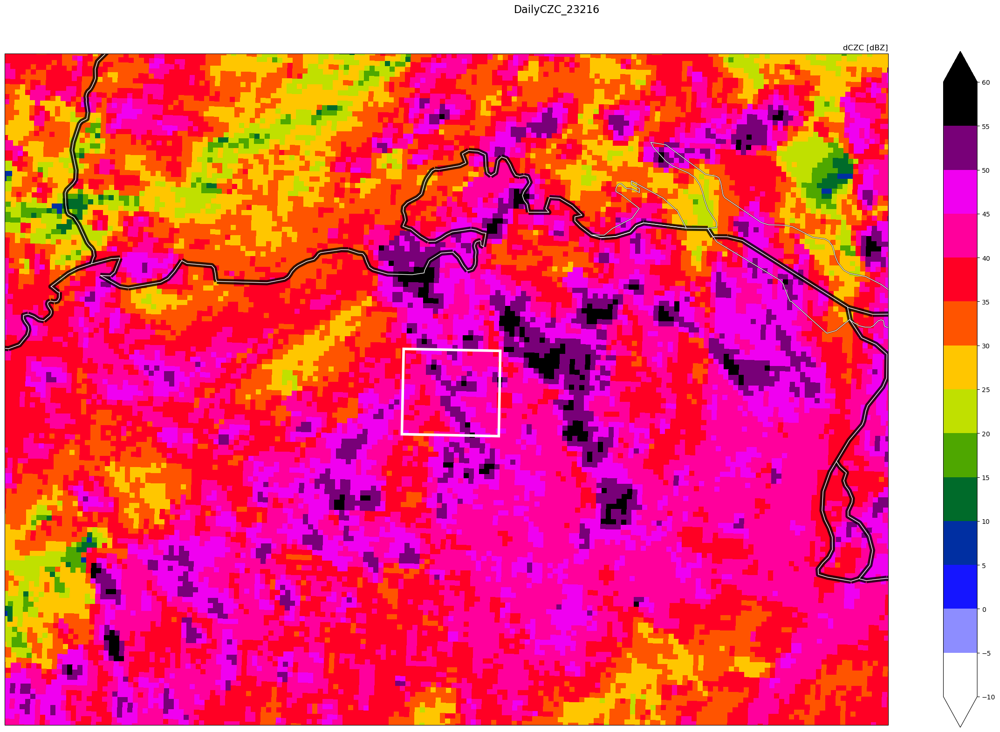

In [5]:
# Daily max echo over Zurich

projection = ccrs.epsg(3035)
# Create figure
fig, ax = plt.subplots(figsize=(24, 16), subplot_kw={'projection': projection})

edgecolor='black'

# Plot Reflectivity composite
cmap_czc.set_bad(color='grey')
p1 = ax.pcolormesh(clons, clats, dCZC, cmap=cmap_czc, norm=czc_norm, transform=projection)
# Add a colorbar
cbar1 = plt.colorbar(p1, ax=ax, extend='both', cmap=cmap_czc, norm=czc_norm, boundaries=czc_levels, ticks=czc_levels
                     )
cbar1.outline.set_edgecolor(edgecolor)
cbar1.ax.yaxis.set_tick_params(color=edgecolor)
plt.setp(plt.getp(cbar1.ax.axes, 'yticklabels'), color=edgecolor)
ax.set_title('dCZC [dBZ]', color=edgecolor, loc='right')


ax.set_extent(Zurich_extent, crs=ccrs.PlateCarree())
        # Add geographic features
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=8)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.8, linewidth=2)
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle='-')
ax.add_feature(cfeature.COASTLINE, edgecolor='white', alpha=1)
ax.add_feature(cfeature.LAKES, edgecolor='white', facecolor='none', alpha=1)

import matplotlib.patches as patches


# Create a Rectangle patch
zurich_rect = patches.Rectangle(
    (zurich_coords[0][0], zurich_coords[0][1]),
    zurich_coords[2][0] - zurich_coords[0][0],
    zurich_coords[2][1] - zurich_coords[0][1],
    linewidth=4,
    edgecolor='white',
    facecolor='none',
    transform=ccrs.PlateCarree()
)

# Add the patch to the Axes
ax.add_patch(zurich_rect)



# Set main title
plt.suptitle("DailyCZC_" + day , color=edgecolor, fontsize=16)
# Adjust layout and display the plot
plt.tight_layout(rect=[0, 0, 1, 0.95])

#plt.savefig("/users/fackerma/newproject1/figures/negative_cases/dCZC_" + day, dpi=300)

In [270]:
# Defining valid time 
day = '23216'
# 23216 23239
valid_time3 = '1650'
elevation_scan = '3'
radar_station = 'A'
radar_name = 'Albis'

In [265]:
# Data Imports, processing, norming, etc.

# GPSConverter for coordinate transformation
class GPSConverter(object):
    '''
    GPS Converter class which is able to perform convertions between the 
    CH1903 and WGS84 system.
    '''
    # Convert CH y/x/h to WGS height
    def CHtoWGSheight(self, y, x, h):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        h = (h + 49.55) - (12.60 * y_aux) - (22.64 * x_aux)
        return h

    # Convert CH y/x to WGS lat
    def CHtoWGSlat(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lat = (16.9023892 + (3.238272 * x_aux)) + \
                - (0.270978 * pow(y_aux, 2)) + \
                - (0.002528 * pow(x_aux, 2)) + \
                - (0.0447 * pow(y_aux, 2) * x_aux) + \
                - (0.0140 * pow(x_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lat = (lat * 100) / 36
        return lat

    # Convert CH y/x to WGS long
    def CHtoWGSlng(self, y, x):
        # Axiliary values (% Bern)
        y_aux = (y - 600000) / 1000000
        x_aux = (x - 200000) / 1000000
        lng = (2.6779094 + (4.728982 * y_aux) + \
                + (0.791484 * y_aux * x_aux) + \
                + (0.1306 * y_aux * pow(x_aux, 2))) + \
                - (0.0436 * pow(y_aux, 3))
        # Unit 10000" to 1" and convert seconds to degrees (dec)
        lng = (lng * 100) / 36
        return lng

    # Convert decimal angle (° dec) to sexagesimal angle (dd.mmss,ss)
    def DecToSexAngle(self, dec):
        degree = int(math.floor(dec))
        minute = int(math.floor((dec - degree) * 60))
        second = (((dec - degree) * 60) - minute) * 60
        return degree + (float(minute) / 100) + (second / 10000)
		
    # Convert sexagesimal angle (dd.mmss,ss) to seconds
    def SexAngleToSeconds(self, dms):
        degree = 0 
        minute = 0 
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return second + (minute * 60) + (degree * 3600)

    # Convert sexagesimal angle (dd.mmss) to decimal angle (degrees)
    def SexToDecAngle(self, dms):
        degree = 0
        minute = 0
        second = 0
        degree = math.floor(dms)
        minute = math.floor((dms - degree) * 100)
        second = (((dms - degree) * 100) - minute) * 100
        return degree + (minute / 60) + (second / 3600)
    
    # Convert WGS lat/long (° dec) and height to CH h
    def WGStoCHh(self, lat, lng, h):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        h = (h - 49.55) + (2.73 * lng_aux) + (6.94 * lat_aux)
        return h

    # Convert WGS lat/long (° dec) to CH x
    def WGStoCHx(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        x = ((200147.07 + (308807.95 * lat_aux) + \
            + (3745.25 * pow(lng_aux, 2)) + \
            + (76.63 * pow(lat_aux,2))) + \
            - (194.56 * pow(lng_aux, 2) * lat_aux)) + \
            + (119.79 * pow(lat_aux, 3))
        return x

	# Convert WGS lat/long (° dec) to CH y
    def WGStoCHy(self, lat, lng):
        lat = self.DecToSexAngle(lat)
        lng = self.DecToSexAngle(lng)
        lat = self.SexAngleToSeconds(lat)
        lng = self.SexAngleToSeconds(lng)
        # Axiliary values (% Bern)
        lat_aux = (lat - 169028.66) / 10000
        lng_aux = (lng - 26782.5) / 10000
        y = (600072.37 + (211455.93 * lng_aux)) + \
            - (10938.51 * lng_aux * lat_aux) + \
            - (0.36 * lng_aux * pow(lat_aux, 2)) + \
            - (44.54 * pow(lng_aux, 3))
        return y

    def LV03toWGS84(self, east, north, height):
        '''
        Convert LV03 to WGS84 Return a array of double that contain lat, long,
        and height
        '''
        d = []
        d.append(self.CHtoWGSlat(east, north))
        d.append(self.CHtoWGSlng(east, north))
        d.append(self.CHtoWGSheight(east, north, height))
        return d
        
    def WGS84toLV03(self, latitude, longitude, ellHeight):
        '''
        Convert WGS84 to LV03 Return an array of double that contaign east,
        north, and height
        '''
        d = []
        d.append(self.WGStoCHy(latitude, longitude))
        d.append(self.WGStoCHx(latitude, longitude))
        d.append(self.WGStoCHh(latitude, longitude, ellHeight))
        return d
        
if __name__ == "__main__":
    ''' Example usage for the GPSConverter class.'''

    converter = GPSConverter()

    # Coordinates
    wgs84 = []
    lv03  = [567719, 155077, 1974]
    #567719/ 155077  Altitude: 1974
    # Convert WGS84 to LV03 coordinates
    wgs84 = converter.LV03toWGS84(lv03[0], lv03[1], lv03[2])

    print("WGS84: ")
    print(wgs84)
    print("LV03: ")
    print(lv03)

# Transform function for dealiased velocity
def transform_from_digital(mydata, nyquist):
    myfinaldata = (mydata * 1.0 - 128) * nyquist / 127
    myfinaldata[mydata == 0] = np.nan
    return myfinaldata

# Convert polar coordinates (range, azimuth) to geographic coordinates (lat/lon)
def radar_to_latlon(radar_lat, radar_lon, ranges, azimuths):
    R = 6371.0  # Earth radius in kilometers
    azimuths_rad = np.radians(azimuths)
    latitudes = np.zeros((len(azimuths), len(ranges)))
    longitudes = np.zeros((len(azimuths), len(ranges)))

    for i, az in enumerate(azimuths_rad):
        latitudes[i, :] = radar_lat + (ranges / R) * np.cos(az) * (180.0 / np.pi)
        longitudes[i, :] = radar_lon + (ranges / R) * np.sin(az) * (180.0 / np.pi) / np.cos(np.radians(radar_lat))

    return latitudes, longitudes

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data=pd.read_csv(file).iloc[8:]
        headers=pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df=pd.DataFrame()
        for n in range(len(data)):
            t=data.iloc[n].str.split(';',expand=True)
            trt_df.loc[n,'traj_ID']=int(t[0].values)
            trt_df.loc[n,'time']=int(t[1].values)
            trt_df.loc[n,'lon']=t[2].values.astype(float)
            trt_df.loc[n,'lat']=t[3].values.astype(float)
            chx,chy=c_transform([trt_df.loc[n,'lon']],[trt_df.loc[n,'lat']])
            ix=np.round((chx-o_x)/1000).astype(int)
            if ix>=710: ix=709
            iy=np.round((chy-o_y)/1000).astype(int)
            if iy>=640: iy=639
            n2=27
            if int(ttime)>=221520631: n2=82
            tt=np.array(t)[0,n2:-1]
            tt=np.reshape(tt,[int(len(tt)/2),2])
            trt_df.loc[n,'chx']=chx
            trt_df.loc[n,'chy']=chy
            lat=tt[:,1].astype(float); lon=tt[:,0].astype(float)
            # trt_df=trt_df.astype(str)
            chx,chy=c_transform(lon,lat)
            ix=np.round((chx-o_x)/1000).astype(int)
            iy=np.round((chy-o_y)/1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr,cc]=int(t[0].values);
    # print(np.nanmax(cells))
    timelist=[str(ttime)]
    return trt_df, [cells], timelist

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'TRTC/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data = pd.read_csv(file).iloc[8:]
        headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df = pd.DataFrame()
        geometries = []  # New list to store geometries

        for n in range(len(data)):
            # ... (existing code remains the same)
            t = data.iloc[n].str.split(';', expand=True)
            trt_df.loc[n, 'traj_ID'] = int(t[0].values)
            trt_df.loc[n, 'time'] = int(t[1].values)
            trt_df.loc[n, 'lon'] = t[2].values.astype(float)
            trt_df.loc[n, 'lat'] = t[3].values.astype(float)
            chx, chy = c_transform([trt_df.loc[n, 'lon']], [trt_df.loc[n, 'lat']])
            ix = np.round((chx - o_x) / 1000).astype(int)
            if ix >= 710: ix = 709
            iy = np.round((chy - o_y) / 1000).astype(int)
            if iy >= 640: iy = 639
            n2 = 27
            if int(ttime) >= 221520631: n2 = 82
            tt = np.array(t)[0, n2:-1]
            tt = np.reshape(tt, [int(len(tt) / 2), 2])
            trt_df.loc[n, 'chx'] = chx
            trt_df.loc[n, 'chy'] = chy
            lat = tt[:, 1].astype(float)
            lon = tt[:, 0].astype(float)
            chx, chy = c_transform(lon, lat)
            ix = np.round((chx - o_x) / 1000).astype(int)
            iy = np.round((chy - o_y) / 1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr, cc] = int(t[0].values)
            # Create polygon for this cell
            polygon_coords = list(zip(lon, lat))
            cell_polygon = Polygon(polygon_coords)
            geometries.append(cell_polygon)
        
        # Add geometry column to trt_df
        trt_df['geometry'] = geometries
    
        # Convert trt_df to GeoDataFrame
        trt_df = gpd.GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")

    timelist=[str(ttime)]
    return trt_df, [cells], timelist

# Define VAD reading function
def read_VAD(file_VAD):
    mydoc = xml.dom.minidom.parse(file_VAD)

    levels = mydoc.getElementsByTagName('level')
   
    heights = mydoc.getElementsByTagName('height')
    speeds = mydoc.getElementsByTagName('speed')
    directions = mydoc.getElementsByTagName('direction')
   
    vad_levels=np.zeros(len(levels))
    vad_heights=np.zeros(len(levels))
    vad_speeds=np.zeros(len(levels))
    vad_directions=np.zeros(len(levels))
    for m in range(0,len(levels)):
        vad_levels[m]=levels[m].firstChild.data
        vad_heights[m]=heights[m].firstChild.data
        vad_speeds[m]=speeds[m].firstChild.data
        vad_directions[m]=directions[m].firstChild.data
    vad_s=np.zeros(150); vad_d=np.zeros(150); vad_s[:]=np.nan; vad_d[:]=np.nan;
    for n in range(0,150):
        for m in range(0,len(levels)):
            if vad_levels[m]==n:
                vad_s[n]=vad_speeds[m]
                vad_d[n]=vad_directions[m]
       
       
    vad_u = np.multiply(vad_s, np.cos(np.radians(vad_d)))
    vad_v = np.multiply(vad_s, np.sin(np.radians(vad_d)))
   
    vadu=np.zeros(15); vadv=np.zeros(15);
    for n in range(0,15):
        a=n*10
        vadu[n]=np.nanmean(vad_u[a:a+10])
        vadv[n]=np.nanmean(vad_v[a:a+10])
       
    return vadu, vad_u, vadv, vad_v

# Function to calculate azimuth angle from radar to downburst location
def calculate_azimuth(lat1, lon1, lat2, lon2):
    # Convert to radians
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    
    # Calculate azimuth
    delta_lon = lon2 - lon1
    x = math.sin(delta_lon) * math.cos(lat2)
    y = math.cos(lat1) * math.sin(lat2) - math.sin(lat1) * math.cos(lat2) * math.cos(delta_lon)
    azimuth = math.atan2(x, y)
    azimuth_deg = math.degrees(azimuth)
    
    # Normalize to 0-360 degrees
    return (azimuth_deg + 360) % 360

# Convolves and normalizes 2D data with a 3x3 kernel
def conv(data):
    """
    Convolves and normalizes 2D data with a 3x3 kernel

    Parameters
    ----------
    data : 2-D array
        data to be convolved.

    Returns
    -------
    d_conv : 2-D array
        convolved data.

    """
    ## convolves 2D data with a 3x3 kernel, equal weights, wrapped boundary, NaN values ignored / filled in
    g_kernel=np.ones([3,3])/9
    d_conv=convolve(data,g_kernel, boundary='wrap')
    return d_conv

# azimuthal centered difference derivative for polar data -> wraps around 0/360
def az_cd(myfinaldata, nyquist, threshold, resolution, min_size):
    """
    azimuthal centered difference derivative for polar data -> wraps around 0/360

    Parameters
    ----------
    myfinaldata : 2D array
        input data.
    nyquist : float
        Nyquist velocity of raw velocity data.
    threshold : float
        shear correction threshold.
    resolution : float
        radial resolution of data.
    min_size : int
        minimum number of gates required for correction.

    Returns
    -------
    myshear_cor : 2D array
        azimuthal derivative, corrected for unfolding errors.
    mygateshear_cor : 2D array
        azimuthal difference (no normalization by distance), corrected for unfolding errors.

    """
    ## azimuthal derivative, centered difference
    ## corrects for anomalous shear exceeding threshold
    ## shear only corrected if contiguous area of several pixels
    myfinaldata_1=np.zeros(myfinaldata.shape)
    myfinaldata_1[:-1,:]=myfinaldata[1:,:]
    myfinaldata_1[-1,:]=myfinaldata[0,:]
    myfinaldata_2=np.zeros(myfinaldata.shape)
    myfinaldata_2[1:,:]=myfinaldata[:-1,:]
    myfinaldata_2[0,:]=myfinaldata[-1,:]
    
    distance=np.arange(0.5*resolution, myfinaldata.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,myfinaldata.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)
    
    myshear_1=(myfinaldata-myfinaldata_1)/(2*distance)*-(1)
    myshear_2=(myfinaldata_2-myfinaldata)/(2*distance)*(-1)
    myshear_3=(myfinaldata_2-myfinaldata_1)/(2*distance)*(-1)
    
    myshear_1_cor=shear_cor(myshear_1, distance, threshold, nyquist, min_size)
        
    myshear_2_cor=shear_cor(myshear_2, distance, threshold, nyquist, min_size)

    myshear_3_cor=shear_cor(myshear_3, distance, threshold, nyquist, min_size)
    
    myshear_cor=np.nansum([myshear_2_cor,myshear_1_cor],axis=0)
    myshear_cor[np.isnan(myfinaldata)==1]=myshear_3_cor[np.isnan(myfinaldata)==1]
    mygateshear_cor=myshear_cor*distance
    
    return myshear_cor, mygateshear_cor

# Identifies unfolding errors in derivative and corrects for them
def shear_cor(myshear, distance, threshold, nyquist, min_size):
    """
    Identifies unfolding errors in derivative and corrects for them

    Parameters
    ----------
    myshear : 2D array
        input data.
    distance : 2D array
        azimuthal Cartesian distance between gates.
    threshold : float
        error identification threshold.
    nyquist : float
        correction interval (nyquist velocity).
    min_size : int
        minimum number of connected erroneous gates.

    Returns
    -------
    myshear_cor : 2D array
        corrected data.

    """
    ## function embedded in centered difference shear
    ## eliminates anomalous shear in contiguous area
    myshear_cor=(myshear*(2*distance))
    thresh_1=(myshear*(2*distance))-threshold
    thresh_2=(myshear*(2*distance))+threshold
    
    mybin_pos=np.zeros(myshear.shape)
    mybin_pos[thresh_1>=0]=1
    labels, n_groups=ndi.label(mybin_pos)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] -= (2*nyquist)
    
    mybin_neg=np.zeros(myshear.shape)
    mybin_neg[thresh_2<=0]=1
    labels, n_groups=ndi.label(mybin_neg)
    for n in range(1, n_groups):
        size=len(np.where(labels==n)[0])
        if size<min_size: labels[labels==n]=0
        else: myshear_cor[labels==n] += (2*nyquist)
    myshear_cor=myshear_cor/(2*distance)
    return myshear_cor

# azimuthal linear least squares derivative        
def az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    azimuthal linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    az_shear : array of same dimensions as data
        azimuthal derivative of data.

    """
    ##azimuthal linear least squares derivative
    az_shear=( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k_thet * ( - np.sum(weights * d_r * d_r) * np.sum(weights) + np.sum(weights * d_r) * np.sum(weights * d_r)) \
                + u_k * (np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) - np.sum(weights * d_r) * np.sum(weights * d_r * d_theta)) )
    return az_shear

# radial linear least squares derivative
def div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights):
    """
    radial linear least squares derivative

    Parameters
    ----------
    d_r : array of same dimensions as data
        radial distance.
    d_theta : array of same dimensions as data
        azimuthal distance.
    u_k_r : array of same dimensions as data
        data weighted radially.
    u_k_thet : array of same dimensions as data
        data weighted azimuthally.
    u_k : array of same dimensions as data
        data weighted uniformly.
    weights : array of same dimensions as data
        weights for convolution.

    Returns
    -------
    div_shear : array of same dimensions as data
        radial derivative of data.

    """
    ##radial linear least squares derivative
    div_shear= ( np.sum(weights * d_r * d_theta) * np.sum(weights * d_r * d_theta) * np.sum(weights) \
                + np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_r) \
                + np.sum(weights * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights * d_theta) \
                - 2 * np.sum(weights * d_r * d_theta) * np.sum(weights * d_r) * np.sum(weights * d_theta) \
                - np.sum(weights * d_theta * d_theta) * np.sum(weights * d_r * d_r) * np.sum(weights)) ** (-1) \
                * ( u_k_r * (- np.sum(weights * d_theta * d_theta) * np.sum(weights) + np.sum(weights * d_theta) * np.sum(weights * d_theta)) \
                + u_k_thet * (np.sum(weights * d_r * d_theta) * np.sum(weights) - np.sum(weights * d_theta) * np.sum(weights * d_r)) \
                + u_k * ( - np.sum(weights * d_r * d_theta) * np.sum(weights * d_theta) + np.sum(weights * d_r) * np.sum(weights * d_theta * d_theta)) )
    return div_shear

# full linear least squares derivative
def llsd(vel, az_min, az_max, w_k, r_k, resolution):
    """
    full linear least squares derivative

    Parameters
    ----------
    vel : 2D array
        input data, polar data.
    az_min : int
        min. number of gates in azimuth.
    az_max : int
        max. number of gates in azimuth.
    w_k : float
        kernel width in azimuth (Cartesian).
    r_k : float
        kernel width in radial (Cartesian).
    resolution : float
        radial resolution.

    Returns
    -------
    az_shear : 2D array
        azimuthal derivative.
    div_shear : 2D array
        radial derivative.

    """
    ##complete linear least squares derivative
    az_shear=np.zeros(vel.shape); az_shear[:]=np.nan
    div_shear=np.zeros(vel.shape); div_shear[:]=np.nan
    
    distance=np.arange(0.5*resolution, vel.shape[1]*resolution 
                       + 0.5*resolution, resolution)
    distance=npm.repmat(distance,vel.shape[0],1)
    distance=np.divide(np.multiply(distance,2*np.pi),360)

    r_h=int(np.floor(az_max/2))
	
    for n2 in range(r_h,vel.shape[1]-r_h):
        
        az_w=int(np.round(w_k/distance[1,n2]));
        if az_w%2 == 0: az_w+=1
        if az_w>az_max: az_w=az_max
        if az_w<az_min: az_w=az_min
        az_r=int(np.floor(az_w/2))
        
        r_w= r_k/resolution;
        if r_w%2 == 0: r_w+=1
        r_w=int(r_w)
        r_r=r_w*resolution
        r_vec=np.arange(-r_r,r_r+resolution,resolution)
        r_vec=np.expand_dims(r_vec,axis=0)
        d_r=np.repeat(r_vec,az_w,axis=0)
        
        d_r=np.zeros([az_w,r_w])
        for n2_2 in range(0,r_w):
            d_r[:,n2_2]=-r_k*n2_2/(r_w-1)+r_k*0.5
        rw_f=int(np.floor(r_w/2))
	    
        d_r2=-copy.deepcopy(d_r); #print(d_r.shape,n2)
        weights=np.ones([az_w,r_w])
        d_theta=copy.deepcopy(distance[:az_w,n2-rw_f:n2+rw_f+1]); d_theta[az_r,:]=0
        d_theta[:az_r,:]=-d_theta[:az_r,:];
        d_thet=copy.deepcopy(d_theta); d_thet=-np.flip(d_thet,1)

        u_k=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],weights,mode='same',boundary='wrap')[:,1]
        u_k_thet=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_thet,mode='same',boundary='wrap')[:,1]
        u_k_r=convolve2d(vel[:,n2-rw_f:n2+rw_f+1],d_r2,mode='same',boundary='wrap')[:,1]

        az_shear[:,n2]= az_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
        div_shear[:,n2]= div_llsd(d_r, d_theta, u_k_r, u_k_thet, u_k, weights)
    return az_shear, div_shear

# c_transform
def c_transform(lon,lat):
    """
    transforms arrays of lat/lon to chx/chy

    Parameters
    ----------
    lon : float
        longitude.
    lat : float
        latitude.

    Returns
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.

    """
    converter = GPSConverter()
    chx=np.zeros([len(lon)])
    chy=np.zeros([len(lon)])
    for n in range(len(lon)):
        chx[n],chy[n],z=converter.WGS84toLV03(lat[n], lon[n], 0)
    return chx,chy

# transform_c 
def transform_c(chx,chy):
    """
    transforms arrays of chx/chy to lat/lon
    
    Parameters
    -------
    chx : float
        chx in m.
    chy : float
        chy in m.
        
    Returns
    ----------
    lon : float
        longitude.
    lat : float
        latitude.



    """
    converter = GPSConverter()
    lon=np.zeros([len(chx)])
    lat=np.zeros([len(chy)])
    for n in range(len(lon)):
        lat[n], lon[n],z=converter.LV03toWGS84(chx[n],chy[n], 0)
    return lon,lat

# Get trajectory ID
def get_traj_id_for_location(df, lon, lat, time):
    point = Point(lon, lat)
    df_at_time = df[df['yyyymmddHHMM'].astype(str).str[-4:] == time]
    containing_cells = df_at_time[df_at_time.contains(point)]
    return containing_cells['traj_ID'].iloc[0] if not containing_cells.empty else None

# Calculate mean propagation speed for a TRT cell
def calculate_mean_speed(df, traj_id, center_time, time_range_minutes):
    center_dt = datetime.strptime(center_time, '%H%M')
    start_dt = center_dt - timedelta(minutes=time_range_minutes)
    end_dt = center_dt + timedelta(minutes=time_range_minutes)
    
    time_range = [(start_dt + timedelta(minutes=5*i)).strftime('%H%M') for i in range(2*time_range_minutes//5 + 1)]
    
    df['vel_x'] = pd.to_numeric(df['vel_x'], errors='coerce')
    df['vel_y'] = pd.to_numeric(df['vel_y'], errors='coerce')
    df['propagation_speed'] = np.sqrt(df['vel_x']**2 + df['vel_y']**2)
    
    speeds = df[(df['traj_ID'] == traj_id) & (df['yyyymmddHHMM'].astype(str).str[-4:].isin(time_range))]['propagation_speed']
    
    return speeds.mean() if not speeds.empty else None

# Calculate Swiss grid coordinates into composite raster points
def swiss_to_grid_index(swiss_x, swiss_y, clons, clats, zh_shape):
    # Initialize transformers
    transformer_swiss_to_3035 = Transformer.from_crs(21781, 3035, always_xy=True)
    
    # Transform Swiss coordinates to EPSG:3035
    x_3035, y_3035 = transformer_swiss_to_3035.transform(swiss_x, swiss_y)
    
    # Calculate distances
    distances = np.sqrt((clons - x_3035)**2 + (clats - y_3035)**2)
    
    # Find the index of the minimum distance
    y_idx, x_idx = np.unravel_index(np.argmin(distances), distances.shape)
    
    # Create a function to get values at specific vertical levels
    def get_value_at_level(zh_array, level):
        if 0 <= level < zh_shape[2]:
            return zh_array[y_idx, x_idx, level]
        else:
            raise ValueError(f"Level must be between 0 and {zh_shape[2]-1}")
    
    return y_idx, x_idx, get_value_at_level

# Load and create cross sections of the wind composite
def load_and_create_cross_sections(year, month, day, valid_time):
    # Load the .npz file
    data = np.load(f'/scratch/mch/fackerma/orders/full_composite_npz/{year}{month}{day}{valid_time}00_conv_wind_composite_data.npz')
    
    # Access the specific arrays
    ZH = data['ZH_max']
    rad_shear = data['RAD_SHEAR_LLSD_max']
    az_shear = data['AZ_SHEAR_LLSD_abs_max']
    RVEL = data['RVEL_DE_abs_max']
    KDP = data['KDP_max']
    ZDR = data['ZDR_max']
    
    # Create cross-sections and 2D projections for each array
    arrays = [ZH, rad_shear, az_shear, RVEL, KDP, ZDR]
    names = ['ZH', 'rad_shear', 'az_shear', 'RVEL', 'KDP', 'ZDR']
    
    results = {}
    
    for arr, name in zip(arrays, names):
        # Create cross-sections
        results[f'{name}_x_cross'] = arr[y_idx, x_start:x_end, :]
        results[f'{name}_y_cross'] = arr[y_start:y_end, x_idx, :]
        
        # Create 2D max projection
        results[f'{name}_2d'] = np.nanmax(arr, axis=2)
    
    return results
# All results are stored in a dictionary, with keys formatted as '{name}_x_cross', '{name}_y_cross', and '{name}_2d'



# Radar locations
if radar_station=='L':
    radar_lat = 46.0401
    radar_lon = 8.8334
    radar_alt = 1627 
if radar_station=='P':
    radar_lat = 46.37083
    radar_lon = 7.48694
    radar_alt = 2927
if radar_station=='W':
    radar_lat = 46.832
    radar_lon = 9.796
    radar_alt = 2892 
if radar_station=='A':
    radar_lat = 47.2841
    radar_lon = 8.5117
    radar_alt = 938 
if radar_station=='D':
    radar_lat = 46.425676
    radar_lon = 6.100092
    radar_alt = 1670

# Coordinates of cities
locarno_lat = 46.1700
locarno_lon = 8.7996
lugano_lat = 46.0037
lugano_lon = 8.9511

# Load radar data
path = '/scratch/mch/fackerma/orders/negative_cases/case_040823'

file = glob.glob(path + '/ML/ML' + radar_station + day + valid_time3 + '0U.00' + elevation_scan)
file2 = glob.glob(path +'/DV/srn/data/tmp/mof/DV' + radar_station + '/DV' + radar_station + day + valid_time3 + '7L.80' + elevation_scan) # Dealiased velocity
file3 = glob.glob(path +'/HZC/HZC' + day + valid_time3 + 'VL.801') # Freezing level height composite
#file4 = glob.glob(path +'/VAL/VA' + radar_station + '21194' + valid_time3 + '7U.019') # Vertical wind profile above radar
file5 = glob.glob(path +'/BZC/BZC' + day + valid_time3 + 'VL.845') # POH
file6 = glob.glob(path +'/MZC/MZC' + day + valid_time3 + 'VL.850') # MESH
file7 = glob.glob(path +'/TRTC/CZC' + day + valid_time3 + '0T.rdt') # Thunderstorm radar tracking; or .rdt .trt
file8 = glob.glob(path +'/CZC/CZC' + day + valid_time3 + 'VL.801') # Reflectivity composite
file9 = glob.glob(path +'/LZC/LZC' + day + valid_time3 + 'VL.801') # VIL composite
file10 = glob.glob(path +'/EZC/EZC' + day + valid_time3 + 'VL.820') # Echotops composite: 815, 820, 845, 850
file11 = glob.glob(path +'/OZC/OZC' + day + valid_time3 + 'VL.830') # CAPPI composite, ranging from 810 to 980 in steps of 10
file12 = glob.glob(path + '/dARC/ARC'+ day + '0000FF.1440') # daily bias corrected rain accumulation
file13 = glob.glob(path + '/dBZC/BZC' + day + '2400VL.845') # daily POH
#file14 = glob.glob(path + '/dRZC/RZC'+day+'2400VL.801') # daily Rain Rate
file15 = glob.glob(path + '/dCZC/CZC'+day+'2400VL.801') # daily Max Echo


# Read the data for the plots
data = pyart.aux_io.read_metranet(file[0], reader='python')
velocity = data.get_field(0, 'velocity').data
reflectivity = data.get_field(0, 'reflectivity').data

dv_data = pyart.aux_io.read_file_py(file2[0], physic_value=False)
dv_digital = dv_data.data
dv_header = dv_data.header
nyq = float(dv_header['nyquist'])
dv_velocity = transform_from_digital(dv_digital, nyq)

hzc_data = radlib.read_file(file3[0],physic_value=True)
hzc=hzc_data.data

dARC_data = radlib.read_file(file12[0],physic_value=True)
dARC=dARC_data.data

dBZC_data = radlib.read_file(file13[0],physic_value=True)
dBZC=dBZC_data.data

#dRZC_data = radlib.read_file(file14[0],physic_value=True)
#dRZC=dRZC_data.data

dCZC_data = radlib.read_file(file15[0],physic_value=True)
dCZC=dCZC_data.data

diff_reflectivity = data.get_field(0, 'differential_reflectivity').data

diff_phase = data.get_field(0, 'uncorrected_differential_phase').data

cc_ratio = data.get_field(0, 'uncorrected_cross_correlation_ratio').data

mzc_data = radlib.read_file(file6[0],physic_value=True)
mzc=mzc_data.data

bzc_data = radlib.read_file(file5[0],physic_value=True)
bzc=bzc_data.data

specw = data.get_field(0, 'spectrum_width').data

czc_data = radlib.read_file(file8[0],physic_value=True)
czc=czc_data.data

lzc_data = radlib.read_file(file9[0],physic_value=True)
lzc=lzc_data.data

ezc_data = radlib.read_file(file10[0],physic_value=True)
ezc=ezc_data.data

ozc_data = radlib.read_file(file11[0],physic_value=True)
ozc=ozc_data.data


valid_time4 = valid_time3 + '0'
path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/negative_cases/case_040823/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time4)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)

#vad = read_VAD(file4[0])

# Convert echotop18 from km to meters
ezc_m = ezc * 1000
# Compute the wind gust estimator 'wge' (Trefalt 2017)
wge = np.sqrt((-3.1 * 10**-6 * (ezc**2)) + (20.6 * lzc))


resolution = 0.5
range_max = reflectivity.shape[1] * resolution
azimuths = np.linspace(0, 360, reflectivity.shape[0])
ranges = np.arange(0, range_max, resolution)

# Kdp own method
smoothed_diff_phase = gaussian_filter1d(diff_phase, sigma=2, axis=1) 
Kdp = np.gradient(smoothed_diff_phase, ranges, axis=1)

# KDP Vulpiani Method
Kdp = pyart.retrieve.kdp_vulpiani(data, psidp_field='uncorrected_differential_phase', band='C', parallel=True)
Kdp = Kdp[0]['data']

llsd_vel = llsd(vel=dv_velocity, az_min=3, az_max=90, w_k=2, r_k=2, resolution=0.5)




# Transform radar polar coordinates to lat/lon
lats, lons = radar_to_latlon(radar_lat, radar_lon, ranges, azimuths)

# Define the Swiss grid (values based on metadata)
chx = np.arange(255000, 255000 + 710 * 1000 + 1, 1000)
chy = sorted(np.arange(-160000, -160000 + 640 * 1000 + 1, 1000), reverse=True)
X, Y = np.meshgrid(chx, chy)
# Initialize transformer for Swiss grid 
transformer = Transformer.from_crs(21781, 3035, always_xy=True)

#lons,lats = transformer.transform(X, Y)
clons, clats = transformer.transform(X, Y)
#lons, lats = transformer.transform(X, Y)

cmap_czc = LinearSegmentedColormap.from_list("custom_cmap", ["black","white", "blue", "green", "yellow","red","magenta"], N=256)
czc_levels = np.arange(-10, 65, 5)  # Steps of 2 for Reflectivity
czc_norm = BoundaryNorm(boundaries=czc_levels, ncolors=256, clip=True)
# Define color steps for Reflectivity and Velocity/Dealiased Velocity
reflectivity_levels = np.arange(-5, 65, 5)  # Steps of 2 for Reflectivity
velocity_levels = np.arange(-25, 26, 5)  # Steps of 1 for Velocity and Dealiased Velocity
hzc_levels = np.arange(1, 10, 1)
diff_reflectivity_levels = np.arange(-1,3.5,0.5)
diff_phase_levels = np.arange(-70,90,20)
cc_ratio_levels = np.arange(0.7,1,0.05)
mzc_levels = np.arange(0,5.5,0.5)
bzc_levels = np.arange(0,101,10)
specw_levels = np.arange(0,7,1)
Kdp_levels = np.arange(0,5.5,0.5)
lzc_levels = np.arange(2.5,25,2.5)
ezc_levels = np.arange(2,16,2)
wge_levels = np.arange(2,20,2)
az_shear_levels = np.arange(-5,5.5,1)
div_shear_levels = np.arange(-5,5.5,1)
# Create boundary norms
reflectivity_norm = BoundaryNorm(boundaries=reflectivity_levels, ncolors=plt.cm.inferno.N, clip=True)
velocity_norm = BoundaryNorm(boundaries=velocity_levels, ncolors=256, clip=True)
hzc_norm = BoundaryNorm(boundaries=hzc_levels, ncolors=256, clip=True)
diff_reflectivity_norm = BoundaryNorm(boundaries=diff_reflectivity_levels, ncolors=256, clip=True)
diff_phase_norm = BoundaryNorm(boundaries=diff_phase_levels, ncolors=256, clip=True)
cc_ratio_norm = BoundaryNorm(boundaries=cc_ratio_levels, ncolors=256, clip=True)
mzc_norm = BoundaryNorm(boundaries=mzc_levels, ncolors=256, clip=True)
bzc_norm = BoundaryNorm(boundaries=bzc_levels, ncolors=256, clip=True)
specw_norm = BoundaryNorm(boundaries=specw_levels, ncolors=256, clip=True)
Kdp_norm = BoundaryNorm(boundaries=Kdp_levels, ncolors=256, clip=True)
lzc_norm = BoundaryNorm(boundaries=lzc_levels, ncolors=256, clip=True)
ezc_norm = BoundaryNorm(boundaries=ezc_levels, ncolors=256, clip=True)
wge_norm = BoundaryNorm(boundaries=wge_levels, ncolors=256, clip=True)
az_shear_norm = BoundaryNorm(boundaries=az_shear_levels, ncolors=256, clip=True)
div_shear_norm = BoundaryNorm(boundaries=div_shear_levels, ncolors=256, clip=True)

cmap_velocity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white", "red"], N=256)
cmap_hzc = LinearSegmentedColormap.from_list("custom_cmap", ["white", "dodgerblue", "midnightblue"], N=256)
cmap_diff_reflectivity = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white","red"], N=256)
cmap_diff_phase = LinearSegmentedColormap.from_list("custom_cmap", ["blue", "white","red"], N=256)
cmap_cc_ratio = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_Kdp = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_bzc = LinearSegmentedColormap.from_list("custom_cmap", ["black","yellow", "red"], N=256)
cmap_specw = LinearSegmentedColormap.from_list("custom_cmap", ["darkblue", "lightblue","yellow","orange","red"], N=256)
cmap_lzc = LinearSegmentedColormap.from_list("custom_cmap", ["black", "cyan", "purple"], N=256)
cmap_ezc = plt.cm.Blues
cmap_wge = plt.cm.magma
cmap_vad = plt.cm.Accent
cmap_az_shear = LinearSegmentedColormap.from_list("custom_cmap", ["aqua","blue", "black", "red","yellow"], N=256)
cmap_div_shear = cmap_az_shear

schaden_levels = np.array([0, 1, 3, 5, 10, 20, 50, 100, 150])
schaden_norm= BoundaryNorm(boundaries=schaden_levels, ncolors=256, clip=True)
cmap_schaden = LinearSegmentedColormap.from_list("custom_cmap", ["white","yellow", "orange", "red","purple"], N=256)

# Crowd-sourcing data path
file_cs = '/scratch/mch/fackerma/orders/negative_cases/case_040823/wind_reports_2023_08_04.json'


zurich_coords = [
    (8.4, 47.3),
    (8.4, 47.45),
    (8.65, 47.45),
    (8.65, 47.3)
]

# Extents for plotting
extent_switzerland = [5.77, 10.8, 45.5, 48]
max_extent = [4, 12, 44, 49]
TicinoLarge_extent = [5.5, 10.5, 44.6, 47]
Ticino_extent = [7.7, 9.9, 45.2, 46.65]
Zurich_extent = [7.6,9.45,46.9,47.85]


WGS84: 
[46.54620053012867, 7.017760746224894, 2024.97379732]
LV03: 
[567719, 155077, 1974]
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
py_decoder DBG verb=0
py_decoder DBG verbl=0
swap product table data ......
py_decoder DBG verb=0
py_decoder DBG verbl=0


valid_time3: 16:50
valid_time: 2023-08-04 14:50:00


/tmp/ipykernel_137978/4088277544.py:33: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  return datetime.utcfromtimestamp(ms / 1000)


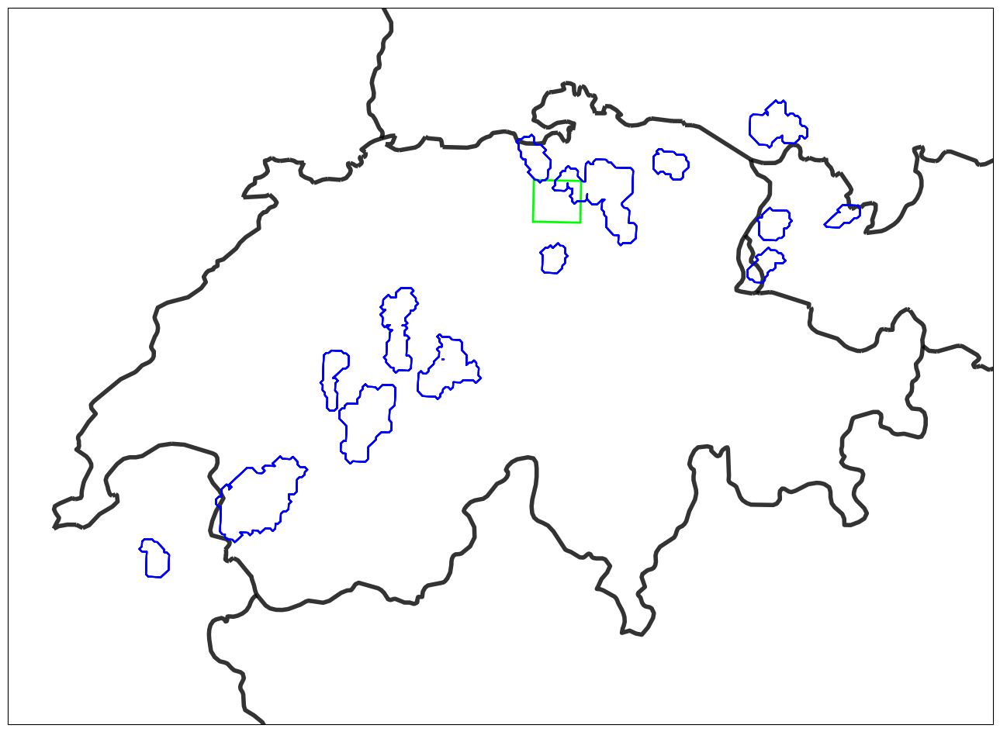

In [271]:
# Set up the plot (assuming you've already created the figure and axis)
projection = ccrs.epsg(3035)
fig, ax = plt.subplots(figsize=(24, 12), subplot_kw={'projection': projection})


valid_time4 = valid_time3 + '0'
path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/negative_cases/case_040823/"}  # Replace with your actual path
trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time4)
# Extract the first element from the list of cells
cells = cells_list[0]
# Define Swiss CH1903 to WGS84 transformer
transformer_trtc = Transformer.from_crs("epsg:21781", "epsg:4326", always_xy=True)
# Grid dimensions and origin
o_x, o_y = 255000, -160000  # Origin in Swiss coordinates
lx, ly = 710, 640           # Grid size (width x height)
cell_size = 1000            # 1 km grid spacing
# Create Swiss grid (CH1903 coordinates)
x_coords = np.linspace(o_x, o_x + (lx - 1) * cell_size, lx)
y_coords = np.linspace(o_y, o_y + (ly - 1) * cell_size, ly)
x_grid, y_grid = np.meshgrid(x_coords, y_coords)
# Convert grid to WGS84 (longitude, latitude)
lon_trtc, lat_trtc = transformer_trtc.transform(x_grid, y_grid)




# Load the JSON file
with open(file_cs, 'r') as file:
    data = json.load(file)

# Convert timestamp to datetime
def convert_timestamp(ms):
    return datetime.utcfromtimestamp(ms / 1000)



valid_time3_with_colon = f"{valid_time3[:2]}:{valid_time3[2:]}"  # Add colon to valid_time3

# Convert valid_time3 to a datetime object
valid_time3_datetime = datetime.strptime(f'2023-08-04 {valid_time3_with_colon}', '%Y-%m-%d %H:%M')

# Calculate valid_time as 2 hours before valid_time3
valid_time = valid_time3_datetime - timedelta(hours=2)

# Format valid_time as a string with the desired format
valid_time_str = valid_time.strftime('%Y-%m-%d %H:%M:%S')

print(f"valid_time3: {valid_time3_with_colon}")
print(f"valid_time: {valid_time_str}")


# Set the valid time and time range
time_range = timedelta(minutes=2.5)

# Filter features within the time range
filtered_features = [
    feature for feature in data
    if abs(convert_timestamp(feature['properties']['timestamp']) - valid_time) <= time_range
]

# Plot the features
for feature in filtered_features:
    lon, lat = feature['geometry']['coordinates']
    ax.plot(lon, lat, 'ro', transform=ccrs.PlateCarree(), markersize=5, color='red')
    print(lon, lat)


# Add coastlines and borders for reference
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.8, linewidth=4)

# Set the extent of the map (adjust as needed)
ax.set_extent(extent_switzerland, crs=ccrs.PlateCarree())

# Create a Rectangle patch
zurich_rect = patches.Rectangle(
    (zurich_coords[0][0], zurich_coords[0][1]),
    zurich_coords[2][0] - zurich_coords[0][0],
    zurich_coords[2][1] - zurich_coords[0][1],
    linewidth=2,
    edgecolor='lime',
    facecolor='none',
    transform=ccrs.PlateCarree()
)
ax.add_patch(zurich_rect)

ax.contour(lon_trtc, lat_trtc, cells, levels=np.arange(0, 11), colors='blue', alpha=0.7, transform=ccrs.PlateCarree())

# Save the figure
plt.savefig("/users/fackerma/newproject1/figures/negative_cases/" + valid_time3 + "_Cells_CS.png", dpi=300, bbox_inches='tight')


## TRTC

## Negative Cases

In [3]:

df = pd.read_pickle("/scratch/mch/fackerma/orders/Gust_Markers/Gust_Markers_3.pkl")


In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from shapely.geometry import Polygon

#zurich_coords = [
#    (8.4, 47.3),
#    (8.4, 47.45),
#    (8.65, 47.45),
#    (8.65, 47.3)
#]

#zurich_coords = [
 #   (8.527, 47.331),
 #   (8.583, 47.352),
#    (8.550, 47.395),
#    (8.567, 47.402),
#    (8.617, 47.385),
#    (8.639, 47.401),
#    (8.542, 47.433),
#    (8.488, 47.425),
#    (8.455, 47.398)
#]



zurich_polygon = Polygon(zurich_coords)
zurich_gdf = gpd.GeoDataFrame({'geometry': [zurich_polygon]}, crs="EPSG:4326")



# Create geometry column
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")


zurich_wind_gusts = gpd.sjoin(gdf, zurich_gdf, how="inner", predicate="within")


In [5]:
# Create a date range from 2019 to 2023
all_dates = pd.date_range(start='2022-01-01', end='2023-12-31', freq='D')

# Get unique dates with wind gust markers in Zurich
zurich_wind_dates = zurich_wind_gusts['Time'].dt.date.unique()

# Find dates without wind gust markers
dates_without_gusts = set(all_dates.date) - set(zurich_wind_dates)

# Sort the dates
dates_without_gusts = sorted(list(dates_without_gusts))


In [6]:
print(f"Number of days without wind gust markers in Zurich: {len(dates_without_gusts)}")
print(f"Number of days with wind gust markers in Zurich: {len(zurich_wind_dates)}")


Number of days without wind gust markers in Zurich: 504
Number of days with wind gust markers in Zurich: 259


In [7]:
from datetime import datetime

def check_date_without_gusts(input_date):
    # Convert input string to date object
    try:
        check_date = datetime.strptime(input_date, "%Y-%m-%d").date()
    except ValueError:
        return "Invalid date format. Please use YYYY-MM-DD."

    # Check if the date is within the range of all_dates
    if check_date < all_dates[0].date() or check_date > all_dates[-1].date():
        return f"The date {input_date} is outside the range of {all_dates[0].date()} to {all_dates[-1].date()}."

    # Check if the date is in dates_without_gusts
    if check_date in dates_without_gusts:
        return f"No gust on {input_date}."
    else:
        return f"Gust on {input_date}."




In [8]:
check_date_without_gusts('2023-07-27')

'No gust on 2023-07-27.'

New bounds: West: 5.904191012734619, South: 45.780250744858265, East: 10.562547746600194, North: 47.8145202229546


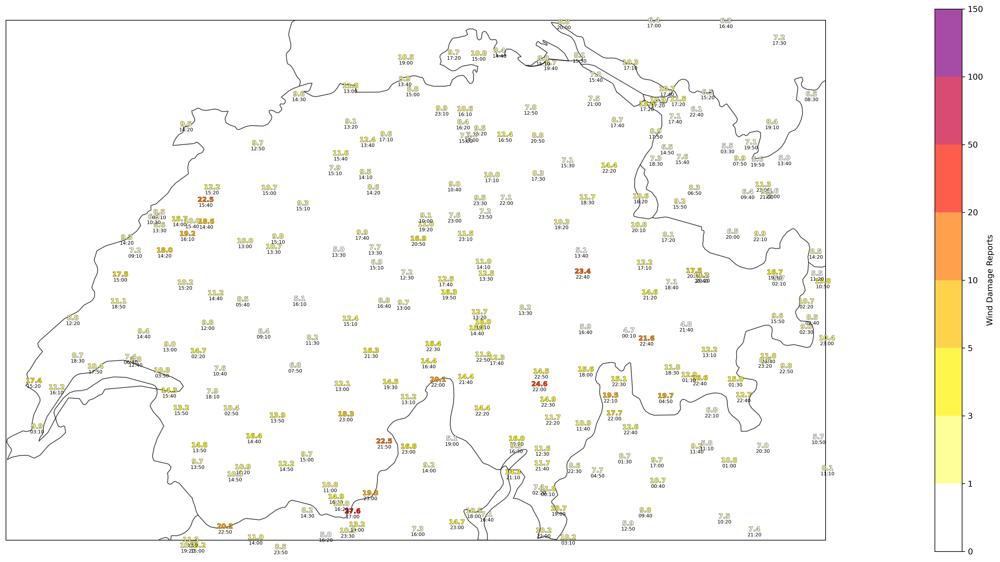

In [ ]:


# Set the projection to WGS84
projection = ccrs.epsg(2056)

# Create a figure with one subplot
fig, ax = plt.subplots(figsize=(24, 12), subplot_kw={'projection': projection}, dpi=300)

# Set background to white for the plot
fig.patch.set_facecolor('white')
ax.set_facecolor('white')


schaden_levels = np.array([0, 1, 3, 5, 10, 20, 50, 100, 150])
schaden_norm= BoundaryNorm(boundaries=schaden_levels, ncolors=256, clip=True)
cmap_schaden = LinearSegmentedColormap.from_list("custom_cmap", ["white","yellow", "orange", "red","purple"], N=256)



# Define the path and open the GeoTIFF file
path = "/scratch/mch/fackerma/orders/Schadendaten/"
target_date = "20230804"
file_name = f"Schaeden_{target_date}_Sturmwind.tif"
file_path = os.path.join(path, file_name)

with rasterio.open(file_path) as src:
    # Define target CRS
    dst_crs = 'EPSG:4326'

    # Calculate the optimal resolution and transformation parameters
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)

    # Create a new array to store the reprojected data
    reprojected_data = np.zeros((height, width), dtype=src.dtypes[0])

    # Reproject the data
    reproject(
        source=rasterio.band(src, 1),
        destination=reprojected_data,
        src_transform=src.transform,
        src_crs=src.crs,
        dst_transform=transform,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Mask nodata values
    reprojected_data = np.ma.masked_equal(reprojected_data, src.nodata)

    # Calculate new bounds
    west, south, east, north = rasterio.transform.array_bounds(height, width, transform)

    # Plot the reprojected raster data
    img = ax.imshow(reprojected_data, extent=(west, east, south, north), 
                    transform=ccrs.PlateCarree(), cmap=cmap_schaden, norm=schaden_norm ,alpha=0.7)

# Add colorbar for the raster data
cbar = plt.colorbar(img, ax=ax, label="Wind Damage Reports", pad=0.1, cmap=cmap_schaden, norm=schaden_norm, boundaries=schaden_levels, ticks=schaden_levels)


# Set the extent of the map to Switzerland (you may need to adjust these values)
ax.set_extent([5.9, 10.5, 45.8, 47.8], crs=ccrs.PlateCarree())

# Add features to the map
ax.add_feature(cfeature.BORDERS, edgecolor='black', linestyle='-', alpha=0.7)
ax.add_feature(cfeature.COASTLINE, edgecolor='black', alpha=0.7)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='none', alpha=0.7)


# Scan the parquet files
df = pl.scan_parquet('/scratch/mch/fackerma/orders/station_data/0_raw/data/**/*.parquet', hive_partitioning=True)

from datetime import datetime
# Filter for the target date and 'fkl010z1' parameter
target_date = datetime(2023, 8, 4, tzinfo=timezone.utc)
df_filtered = df.filter(
    (pl.col('datetime').dt.date() == target_date.date()) &
    (pl.col('param_short') == 'fkl010z1')
)

# Collect the filtered data
df_eager = df_filtered.collect()

# Find the maximum wind gust for each station
max_wind_by_station = df_eager.group_by('station_id').agg([
    pl.col('value').max().alias('max_wind_gust'),
    pl.col('latitude').first().alias('latitude'),
    pl.col('longitude').first().alias('longitude'),
    pl.col('nat_abbr').first().alias('station_abbr'),
    pl.col('datetime').filter(pl.col('value') == pl.col('value').max()).first().alias('max_gust_time')
])

# Sort by max_wind_gust in descending order
max_wind_by_station = max_wind_by_station.sort('max_wind_gust', descending=True)

# Filter data to include only points within the extent
filtered_data = max_wind_by_station.filter(
    (pl.col('longitude') >= west) & 
    (pl.col('longitude') <= east) & 
    (pl.col('latitude') >= south) & 
    (pl.col('latitude') <= north)
)

# Create a custom colormap (white to yellow to red)
colors = ['white', 'yellow', 'red']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

# Normalize wind gust values for color mapping
min_gust = filtered_data['max_wind_gust'].min()
max_gust = filtered_data['max_wind_gust'].max()
norm = plt.Normalize(min_gust, max_gust)

# Plot the wind gust values
for row in filtered_data.iter_rows(named=True):
    # Plot max wind gust value
    text = ax.text(
        row['longitude'], row['latitude'], 
        f"{row['max_wind_gust']:.1f}",
        fontsize=8, fontweight='bold', 
        color=cmap(norm(row['max_wind_gust'])),
        ha='center', va='bottom', transform=ccrs.PlateCarree()
    )
    # Add black contour to the text
    text.set_path_effects([path_effects.Stroke(linewidth=0.5, foreground='black'),
                           path_effects.Normal()])
    
    # Plot UTC time
    utc_time = row['max_gust_time'].strftime('%H:%M')
    ax.text(
        row['longitude'], row['latitude'], 
        utc_time,
        fontsize=6, color='black',
        ha='center', va='top', transform=ccrs.PlateCarree()
    )


# Print the new bounds for verification
print(f"New bounds: West: {west}, South: {south}, East: {east}, North: {north}")

#plt.savefig("/users/fackerma/newproject1/figures/negative_cases/" + day + "_windschaden_stationen.png", dpi=300, bbox_inches='tight')

## TRT Flagging

In [ ]:
# Flagging with negative, spatial prio and 5 / 10 km Buffer

import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point
import os
import datetime
from datetime import datetime, timedelta



# Change definition based on path fot trt files
def process_gust_markers(valid_date3, valid_time3):
    # Convert time format and read TRT data
    valid_time4 = valid_time3 + '0'
    path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/negative_cases/case_040823/"}  
    trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_time4)

    # Load the Gust Markers dataframe
    df = pd.read_pickle("/scratch/mch/fackerma/orders/Gust_Markers/Gust_Markers_3.pkl")

    # Check if trt_df is empty
    if trt_df.empty:
        # Create an empty DataFrame with the required columns
        empty_df = pd.DataFrame(columns=['CS Marker', 'STA Marker', 'Gust_Flag'])
        return empty_df, pd.DataFrame(), gpd.GeoDataFrame(), gpd.GeoDataFrame(), gpd.GeoDataFrame()
    
    zurich_coords = [(8.4, 47.3),(8.4, 47.45),(8.65, 47.45),(8.65, 47.3)]

    # Create a Polygon from the coordinates
    zurich_polygon = Polygon(zurich_coords)

    # Create a GeoDataFrame with the polygon
    zurich_gdf = gpd.GeoDataFrame({'name': ['Zurich']}, geometry=[zurich_polygon], crs="EPSG:4326")


    # Convert trt_df to a GeoDataFrame and create buffer
    trt_gdf = GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")
    trt_gdf_projected = trt_gdf.to_crs(epsg=32632)
    trt_gdf_projected['buffer_geometry'] = trt_gdf_projected.geometry.buffer(10000)
    trt_gdf_with_buffer = trt_gdf_projected.to_crs(epsg=4326)
    trt_gdf_with_buffer['buffer_geometry'] = trt_gdf_with_buffer['buffer_geometry'].to_crs(epsg=4326)

    trt_gdf_small_buffer = trt_gdf.to_crs(epsg=32632)
    trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer.geometry.buffer(5000)
    trt_gdf_small_buffer = trt_gdf_small_buffer.to_crs(epsg=4326)
    trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer['buffer_geometry'].to_crs(epsg=4326)

    # Set up datetime for filtering
    datetime_string = f"{valid_date3} {valid_time3[:2]}:{valid_time3[2:]}:00"
    target_datetime = pd.to_datetime(datetime_string)
    time_window_cs = pd.Timedelta(minutes=2.5)
    time_window_sta = pd.Timedelta(minutes=5)

    # Filter and process CS and STA data
    df_cs = df[df['Source'] == 'CS']
    df_sta = df[df['Source'] == 'STA'].copy()
    df_sta['Time'] = df_sta['Time'] - pd.Timedelta(minutes=5)

    filtered_df_cs = df_cs[(df_cs['Time'] >= target_datetime - time_window_cs) & 
                           (df_cs['Time'] <= target_datetime + time_window_cs)]
    filtered_df_sta = df_sta[(df_sta['Time'] >= target_datetime - time_window_sta) & 
                             (df_sta['Time'] <= target_datetime + time_window_sta)]

    # Convert to GeoDataFrames
    gust_gdf_cs = GeoDataFrame(filtered_df_cs, 
                               geometry=gpd.points_from_xy(filtered_df_cs.Longitude, filtered_df_cs.Latitude),
                               crs="EPSG:4326")
    gust_gdf_sta = GeoDataFrame(filtered_df_sta, 
                                geometry=gpd.points_from_xy(filtered_df_sta.Longitude, filtered_df_sta.Latitude),
                                crs="EPSG:4326")

    # Perform spatial joins for CS gusts
    trt_gdf_buffer = trt_gdf_with_buffer.copy()
    trt_gdf_buffer.set_geometry('buffer_geometry', inplace=True)
    trt_gdf_small_buffer.set_geometry('buffer_geometry', inplace=True)
    matched_gusts_cs = gpd.sjoin(gust_gdf_cs, trt_gdf_small_buffer, how="inner", predicate="within", rsuffix='_trt')
    matched_gusts_sta = gpd.sjoin(gust_gdf_sta, trt_gdf_buffer, how="inner", predicate="within", rsuffix='_trt')

    # For STA gusts, find the closest cell
    def find_closest_cell(gust_point, cells_gdf):
        distances = cells_gdf.geometry.distance(gust_point)
        closest_cell_index = distances.idxmin()
        return closest_cell_index, distances[closest_cell_index]

    sta_closest_cells = matched_gusts_sta.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))
    cs_closest_cells = matched_gusts_cs.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))

    # Convert to DataFrame and remove duplicates
    sta_closest_df = pd.DataFrame(sta_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=sta_closest_cells.index)
    sta_closest_df = sta_closest_df.drop_duplicates(subset=['traj_ID', 'distance'])

    cs_closest_df = pd.DataFrame(cs_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=cs_closest_cells.index)
    cs_closest_df = cs_closest_df.drop_duplicates(subset=['traj_ID', 'distance'])

    # Process CS gusts (using spatial join results)
    #cs_counts = matched_gusts_cs['traj_ID'].value_counts()

    # Process STA gusts (using closest cell approach)
    cs_counts = {}
    for index, row in cs_closest_df.iterrows():
        if row['distance'] <= 5000:  # Only consider gusts within 10km
            cs_counts[row['traj_ID']] = cs_counts.get(row['traj_ID'], 0) + 1

    # Process STA gusts (using closest cell approach)
    sta_counts = {}
    for index, row in sta_closest_df.iterrows():
        if row['distance'] <= 10000:  # Only consider gusts within 10km
            sta_counts[row['traj_ID']] = sta_counts.get(row['traj_ID'], 0) + 1

    # Update trt_df with the new counts
    #trt_df['CS Marker'] = trt_df['traj_ID'].map(cs_counts).fillna(0).astype(int)
    trt_df['CS Marker'] = trt_df.index.map(lambda x: cs_counts.get(x, 0)).fillna(0).astype(int)
    trt_df['STA Marker'] = trt_df.index.map(lambda x: sta_counts.get(x, 0)).fillna(0).astype(int)

    # Check if TRT cell buffer touches Zurich polygon
    #touches_zurich = trt_gdf_buffer.buffer_geometry.intersects(zurich_gdf.geometry.iloc[0])
    touches_zurich = trt_gdf.intersects(zurich_gdf.geometry.iloc[0])
    
    # Assign 'Gust_Flag' based on the new condition
    trt_df['Gust_Flag'] = np.where(
        (trt_df['CS Marker'] > 0) | (trt_df['STA Marker'] > 0),
        'Yes',
        np.where(
            (touches_zurich) &
            (target_datetime.time() >= datetime.strptime("04:00:00", "%H:%M:%S").time()) &
            (target_datetime.time() <= datetime.strptime("20:00:00", "%H:%M:%S").time()) &
            (target_datetime.year in [2022, 2023]),  # Check if the year is 2022 or 2023
            'No',
            '-'
        )
    )

    # Combine matched_gusts_cs with closest STA gusts for consistency
    sta_closest_df = pd.DataFrame(sta_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=matched_gusts_sta.index)
    sta_closest_df = sta_closest_df[sta_closest_df['distance'] <= 10000]
    matched_gusts_sta = gust_gdf_sta.loc[sta_closest_df.index].copy()
    matched_gusts_sta['traj_ID'] = sta_closest_df['traj_ID']
    matched_gusts = pd.concat([matched_gusts_cs, matched_gusts_sta])

    return trt_df, matched_gusts, gust_gdf_cs, gust_gdf_sta, trt_gdf_with_buffer, trt_gdf_buffer, matched_gusts_sta, matched_gusts_cs, trt_gdf, target_datetime, sta_closest_df, sta_closest_cells, zurich_gdf, touches_zurich, trt_gdf_small_buffer



In [ ]:
# Process the trt files

valid_date3 = '2023-08-04'
start_time = datetime.strptime('0000', '%H%M').time()
end_time = datetime.strptime('2355', '%H%M').time()
time_delta = timedelta(minutes=5)

current_time = datetime.combine(datetime.min, start_time)
while current_time.time() <= end_time:
    valid_time3 = current_time.strftime('%H%M')
    print(f"Processing for time: {valid_time3}")
    
    trt_df, matched_gusts, gust_gdf_cs, gust_gdf_sta = process_gust_markers(valid_date3, valid_time3)

    # Generate the filename
    filename = f'trt_df_{valid_date3}_{valid_time3}.pkl'

    # Save the DataFrame (empty or not)
    trt_df.to_pickle(f'/scratch/mch/fackerma/orders/trt_df_testset1/{filename}')
    
    if valid_time3 == '2355':
        break

    current_time += time_delta

print("Processing complete for all times.")

In [ ]:
# Process a trt_df file
valid_date3 = '2023-08-04'
valid_time3 = '1430'
day = '23216'

trt_df, matched_gusts, gust_gdf_cs, gust_gdf_sta, trt_gdf_with_buffer, trt_gdf_buffer, matched_gusts_sta, matched_gusts_cs, trt_gdf, target_datetime, sta_closest_df, sta_closest_cells, zurich_gdf, touches_zurich, trt_gdf_small_buffer = process_gust_markers(valid_date3, valid_time3)


/tmp/ipykernel_31020/2311365253.py:84: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = cells_gdf.geometry.distance(gust_point)
/tmp/ipykernel_31020/2311365253.py:84: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = cells_gdf.geometry.distance(gust_point)


## Inspect TRT Flagging

/tmp/ipykernel_31020/3860752802.py:27: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  trt_gdf_buffer.plot(ax=ax, column='buffer_geometry', color='white', alpha=0.3, label='10km Buffer', edgecolor='black')
/tmp/ipykernel_31020/3860752802.py:30: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  trt_gdf_small_buffer.plot(ax=ax, column='buffer_geometry', color='yellow', alpha=0.3, label='5km Buffer', edgecolor='black')
/tmp/ipykernel_31020/3860752802.py:56: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc='upper left', fontsize=12)


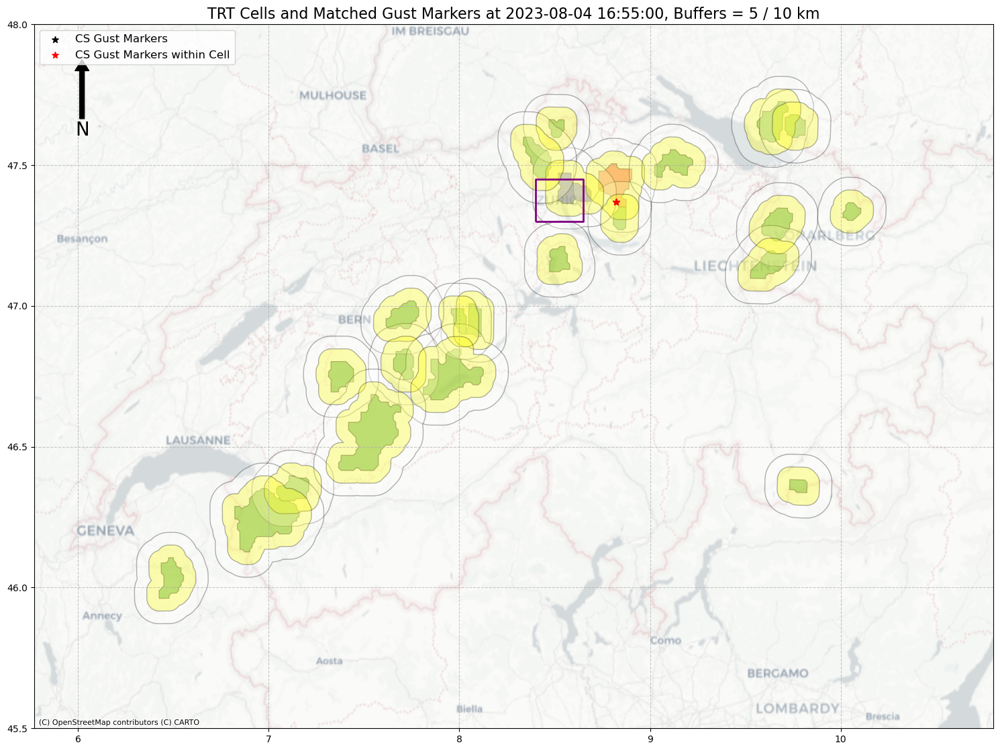

In [45]:
import matplotlib.pyplot as plt
import contextily as ctx
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# Set the figure size
fig, ax = plt.subplots(figsize=(15, 15))


# Set the spatial extent
extent = extent_switzerland
#extent = Zurich_extent
ax.set_xlim(extent[0], extent[1])
ax.set_ylim(extent[2], extent[3])

# Plot the original TRT cell geometries
#trt_gdf_with_buffer.plot(ax=ax, color='green', edgecolor='black', linewidth=1, label='TRT Cells', alpha=0.5)

# Convert trt_df to GeoDataFrame
trt_gdf_new = gpd.GeoDataFrame(trt_df, geometry='geometry')

# Plot the TRT cells with conditional coloring
trt_gdf_new.plot(ax=ax, color=trt_gdf_new['Gust_Flag'].map({'Yes': 'red', '-': 'green', 'No': 'blue'}), 
             edgecolor='black', linewidth=1, label='TRT Cells', alpha=0.5)

# Plot the buffer geometries
trt_gdf_buffer.plot(ax=ax, column='buffer_geometry', color='white', alpha=0.3, label='10km Buffer', edgecolor='black')

# Plot the buffer geometries
trt_gdf_small_buffer.plot(ax=ax, column='buffer_geometry', color='yellow', alpha=0.3, label='5km Buffer', edgecolor='black')

# Plot CS gust markers if not empty
if not gust_gdf_cs.empty:
    gust_gdf_cs.plot(ax=ax, color='black', markersize=50, label='CS Gust Markers', marker='*')

# Plot STA gust markers if not empty
if not gust_gdf_sta.empty:
    gust_gdf_sta.plot(ax=ax, color='black', markersize=40, label='STA Gust Markers', marker='o')

# Plot matched CS gust markers if not empty
if not matched_gusts_cs.empty:
    matched_gusts_cs.plot(ax=ax, color='red', markersize=50, label='CS Gust Markers within Cell', marker='*')

# Plot matched STA gust markers if not empty
if not matched_gusts_sta.empty:
    matched_gusts_sta.plot(ax=ax, color='blue', markersize=40, label='STA Gust Markers within 10km Buffer', marker='o')

# Plot the Zurich polygon
zurich_gdf.plot(ax=ax, facecolor='none', edgecolor='purple', linewidth=2, label='Zurich Area')

# Add a basemap
ctx.add_basemap(ax, crs=trt_gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)

# Add title and legend
plt.title(f"TRT Cells and Matched Gust Markers at {target_datetime}, Buffers = 5 / 10 km", fontsize=16)
plt.legend(loc='upper left', fontsize=12)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

# Add north arrow
x, y, arrow_length = 0.05, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

# Show the plot
plt.tight_layout()

#plt.savefig("/users/fackerma/newproject1/figures/negative_cases/Gust_Markers/2_" + day + '_' + valid_time3 + "_10km_spatprio_.png", dpi=300, bbox_inches='tight')


## TRT Flagging on 5 year period

In [ ]:
# Flagging with negative, spatial prio and 5 / 10 km Buffer

import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point
import os
import datetime
from datetime import datetime, timedelta

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'/*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'/*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data = pd.read_csv(file).iloc[8:]
        headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df = pd.DataFrame()
        geometries = []  # New list to store geometries

        for n in range(len(data)):
            # ... (existing code remains the same)
            t = data.iloc[n].str.split(';', expand=True)
            trt_df.loc[n, 'traj_ID'] = int(t[0].values)
            trt_df.loc[n, 'time'] = int(t[1].values)
            trt_df.loc[n, 'lon'] = t[2].values.astype(float)
            trt_df.loc[n, 'lat'] = t[3].values.astype(float)
            chx, chy = c_transform([trt_df.loc[n, 'lon']], [trt_df.loc[n, 'lat']])
            ix = np.round((chx - o_x) / 1000).astype(int)
            if ix >= 710: ix = 709
            iy = np.round((chy - o_y) / 1000).astype(int)
            if iy >= 640: iy = 639
            n2 = 27
            #if int(ttime) >= 221520631: n2 = 82
            tt = np.array(t)[0, n2:-1]
            tt = np.reshape(tt, [int(len(tt) / 2), 2])
            trt_df.loc[n, 'chx'] = chx
            trt_df.loc[n, 'chy'] = chy
            lat = tt[:, 1].astype(float)
            lon = tt[:, 0].astype(float)
            chx, chy = c_transform(lon, lat)
            ix = np.round((chx - o_x) / 1000).astype(int)
            iy = np.round((chy - o_y) / 1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr, cc] = int(t[0].values)
            # Create polygon for this cell
            polygon_coords = list(zip(lon, lat))
            cell_polygon = Polygon(polygon_coords)
            geometries.append(cell_polygon)
        
        # Add geometry column to trt_df
        trt_df['geometry'] = geometries
    
        # Convert trt_df to GeoDataFrame
        trt_df = gpd.GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")

    timelist=[str(ttime)]
    return trt_df, [cells], timelist

def process_gust_markers(valid_date3, valid_time3):
    # Convert time format and read TRT data
    # Convert valid_date3 to a datetime object
    date_obj = datetime.strptime(valid_date3, '%Y-%m-%d')
    # Extract the last two digits of the year and the day of the year
    year_last_two = date_obj.strftime('%y')  # Last two digits of the year
    day_of_year = date_obj.timetuple().tm_yday  # Day of the year (1-366)
    # Combine them into the desired format
    valid_date4 = f"{year_last_two}{day_of_year:03d}"  # Ensure day_of_year is zero-padded to 3 digits
    valid_time4 = valid_time3 + '0'
    path_trtc = {"lomdata": "/scratch/mch/fackerma/orders/TRT_set"}  
    trt_df, cells_list, timelist = read_TRT(path_trtc, ttime=valid_date4+valid_time4)

    # Load the Gust Markers dataframe
    df = pd.read_pickle("/scratch/mch/fackerma/orders/Gust_Markers/Gust_Markers_3.pkl")

    # Check if trt_df is empty
    if trt_df.empty:
        # Create an empty DataFrame with the required columns
        empty_df = pd.DataFrame(columns=['geometry', 'CS Marker', 'STA Marker', 'ESWD Marker', 'Gust_Flag'])
        trt_df = empty_df.copy()
        return trt_df
    else:
        zurich_coords = [(8.4, 47.3), (8.4, 47.45), (8.65, 47.45), (8.65, 47.3)]

        # Create a Polygon from the coordinates
        zurich_polygon = Polygon(zurich_coords)

        # Create a GeoDataFrame with the polygon
        zurich_gdf = gpd.GeoDataFrame({'name': ['Zurich']}, geometry=[zurich_polygon], crs="EPSG:4326")

        # Alternative: Extract the larges 5 cities based on popdense > 2000 / km sqared
        file_path_swiss_cities = "largest_5_polygons_wgs84.gpkg"
        # Read the GeoPackage into a GeoDataFrame
        swiss_cities_gdf = gpd.read_file(file_path_swiss_cities)

        # Convert trt_df to a GeoDataFrame and create buffer
        trt_gdf = GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")
        trt_gdf_projected = trt_gdf.to_crs(epsg=32632)
        trt_gdf_projected['buffer_geometry'] = trt_gdf_projected.geometry.buffer(10000)
        trt_gdf_with_buffer = trt_gdf_projected.to_crs(epsg=4326)
        trt_gdf_with_buffer['buffer_geometry'] = trt_gdf_with_buffer['buffer_geometry'].to_crs(epsg=4326)

        trt_gdf_small_buffer = trt_gdf.to_crs(epsg=32632)
        trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer.geometry.buffer(5000)
        trt_gdf_small_buffer = trt_gdf_small_buffer.to_crs(epsg=4326)
        trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer['buffer_geometry'].to_crs(epsg=4326)

        # Set up datetime for filtering
        datetime_string = f"{valid_date3} {valid_time3[:2]}:{valid_time3[2:]}:00"
        target_datetime = pd.to_datetime(datetime_string)
        time_window_cs = pd.Timedelta(minutes=2.5)
        time_window_sta = pd.Timedelta(minutes=5)
        time_window_eswd = pd.Timedelta(minutes=2.5)

        # Filter and process CS and STA data
        df_cs = df[df['Source'] == 'CS']
        df_sta = df[df['Source'] == 'STA'].copy()
        df_sta['Time'] = df_sta['Time'] - pd.Timedelta(minutes=5)
        df_eswd = df[df['Source'] == 'ESWD']

        filtered_df_cs = df_cs[(df_cs['Time'] >= target_datetime - time_window_cs) & 
                               (df_cs['Time'] <= target_datetime + time_window_cs)]
        filtered_df_sta = df_sta[(df_sta['Time'] >= target_datetime - time_window_sta) & 
                                 (df_sta['Time'] <= target_datetime + time_window_sta)]
        filtered_df_eswd = df_eswd[(df_eswd['Time'] >= target_datetime - time_window_eswd) & 
                                 (df_eswd['Time'] <= target_datetime + time_window_eswd)]

        # Convert to GeoDataFrames
        gust_gdf_cs = GeoDataFrame(filtered_df_cs, 
                                   geometry=gpd.points_from_xy(filtered_df_cs.Longitude, filtered_df_cs.Latitude),
                                   crs="EPSG:4326")
        gust_gdf_sta = GeoDataFrame(filtered_df_sta, 
                                    geometry=gpd.points_from_xy(filtered_df_sta.Longitude, filtered_df_sta.Latitude),
                                    crs="EPSG:4326")
        gust_gdf_eswd = GeoDataFrame(filtered_df_eswd, 
                                    geometry=gpd.points_from_xy(filtered_df_eswd.Longitude, filtered_df_eswd.Latitude),
                                    crs="EPSG:4326")

        # After creating trt_gdf_with_buffer:
        trt_gdf_buffer = trt_gdf_with_buffer.to_crs(epsg=4326)  # Ensure CRS matches gust_gdf_sta
        trt_gdf_buffer.set_geometry('buffer_geometry', inplace=True)
        trt_gdf_buffer['buffer_geometry'] = trt_gdf_buffer['buffer_geometry'].to_crs(epsg=4326)

        # Perform spatial joins for CS gusts
        #trt_gdf_buffer = trt_gdf_with_buffer.copy()
        #trt_gdf_buffer.set_geometry('buffer_geometry', inplace=True)
        trt_gdf_small_buffer.set_geometry('buffer_geometry', inplace=True)
        
        matched_gusts_cs = gpd.sjoin(gust_gdf_cs, trt_gdf_small_buffer, how="inner", predicate="within", rsuffix='_trt')
        matched_gusts_cs = matched_gusts_cs.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')
        
        matched_gusts_sta = gpd.sjoin(gust_gdf_sta, trt_gdf_buffer, how="inner", predicate="within", rsuffix='_trt')
        matched_gusts_sta = matched_gusts_sta.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')

        matched_gusts_eswd = gpd.sjoin(gust_gdf_eswd, trt_gdf_small_buffer, how="inner", predicate="within", rsuffix='_trt')
        matched_gusts_eswd = matched_gusts_eswd.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')

        # For STA gusts, find the closest cell
        def find_closest_cell(gust_point, cells_gdf):
            distances = cells_gdf.geometry.distance(gust_point)
            closest_cell_index = distances.idxmin()
            return closest_cell_index, distances[closest_cell_index]

        sta_closest_cells = matched_gusts_sta.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))
        cs_closest_cells = matched_gusts_cs.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))
        eswd_closest_cells = matched_gusts_eswd.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))

        sta_closest_df = pd.DataFrame(sta_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=sta_closest_cells.index)
        #sta_closest_df.drop_duplicates(subset=['traj_ID', 'distance'], inplace=True)
        cs_closest_df = pd.DataFrame(cs_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=cs_closest_cells.index)

        eswd_closest_df = pd.DataFrame(eswd_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=eswd_closest_cells.index)

        cs_counts = {}
        for index, row in cs_closest_df.iterrows():
            if row['distance'] <= 5000:
                cs_counts[row['traj_ID']] = cs_counts.get(row['traj_ID'], 0) + 1

        sta_counts = {}
        for index, row in sta_closest_df.iterrows():
            if row['distance'] <= 10000:
                sta_counts[row['traj_ID']] = sta_counts.get(row['traj_ID'], 0) + 1

        eswd_counts = {}
        for index, row in eswd_closest_df.iterrows():
            if row['distance'] <= 5000:
                eswd_counts[row['traj_ID']] = eswd_counts.get(row['traj_ID'], 0) + 1

        # Update trt_df with the new counts
        trt_df['CS Marker'] = trt_df.index.map(lambda x: cs_counts.get(x, 0)).fillna(0).astype(int)
        trt_df['STA Marker'] = trt_df.index.map(lambda x: sta_counts.get(x, 0)).fillna(0).astype(int)
        trt_df['ESWD Marker'] = trt_df.index.map(lambda x: eswd_counts.get(x, 0)).fillna(0).astype(int)

        touches_zurich = trt_gdf.intersects(zurich_gdf.geometry.iloc[0])
        #touches_swiss_cities = trt_gdf.intersects(swiss_cities_gdf.geometry.iloc[0])

        # Create a new geometry column in trt_gdf based on lon and lat
        trt_gdf['point_geometry'] = trt_gdf.apply(lambda row: Point(row['lon'], row['lat']), axis=1)

        # Perform the intersection check using the new point_geometry column
        touches_swiss_cities = trt_gdf['point_geometry'].apply(
            lambda point: swiss_cities_gdf.intersects(point).any()
        )
        
        # Assign 'Gust_Flag' based on conditions
        trt_df['Gust_Flag'] = np.where(
            (trt_df['CS Marker'] > 1) | (trt_df['STA Marker'] > 0) | (trt_df['ESWD Marker'] > 0),
            'Yes',
            np.where(
                (touches_swiss_cities) &
                (target_datetime.time() >= datetime.strptime("04:00:00", "%H:%M:%S").time()) &
                (target_datetime.time() <= datetime.strptime("20:00:00", "%H:%M:%S").time()) &
                (target_datetime.year in [2022, 2023]),
                'No',
                '-'
            )
        )

    #return trt_df
    return trt_df, gust_gdf_cs, gust_gdf_sta, gust_gdf_eswd, trt_gdf_with_buffer, trt_gdf_buffer, matched_gusts_sta, matched_gusts_cs, matched_gusts_eswd, trt_gdf, target_datetime, sta_closest_df, sta_closest_cells, eswd_closest_df, eswd_closest_cells, zurich_gdf, touches_zurich, trt_gdf_small_buffer, cs_counts, sta_counts, eswd_counts, cs_closest_df, timelist, cs_closest_cells, swiss_cities_gdf

In [106]:

# Process a trt_df file
valid_date3 = '2023-08-04'
valid_time3 = '1655'

#trt_df = process_gust_markers(valid_date3, valid_time3)
trt_df, gust_gdf_cs, gust_gdf_sta, gust_gdf_eswd, trt_gdf_with_buffer, trt_gdf_buffer, matched_gusts_sta, matched_gusts_cs, matched_gusts_eswd, trt_gdf, target_datetime, sta_closest_df, sta_closest_cells, eswd_closest_df, eswd_closest_cells, zurich_gdf, touches_zurich, trt_gdf_small_buffer, cs_counts, sta_counts, eswd_counts, cs_closest_df, timelist, cs_closest_cells, swiss_cities_gdf = process_gust_markers(valid_date3, valid_time3)

/tmp/ipykernel_15731/872258523.py:218: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = cells_gdf.geometry.distance(gust_point)


/tmp/ipykernel_15731/3117010815.py:27: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  trt_gdf_buffer.plot(ax=ax, column='buffer_geometry', color='white', alpha=0.3, label='10km Buffer', edgecolor='black')
/tmp/ipykernel_15731/3117010815.py:30: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  trt_gdf_small_buffer.plot(ax=ax, column='buffer_geometry', color='yellow', alpha=0.3, label='5km Buffer', edgecolor='black')
/tmp/ipykernel_15731/3117010815.py:67: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc='upper left', fontsize=12)


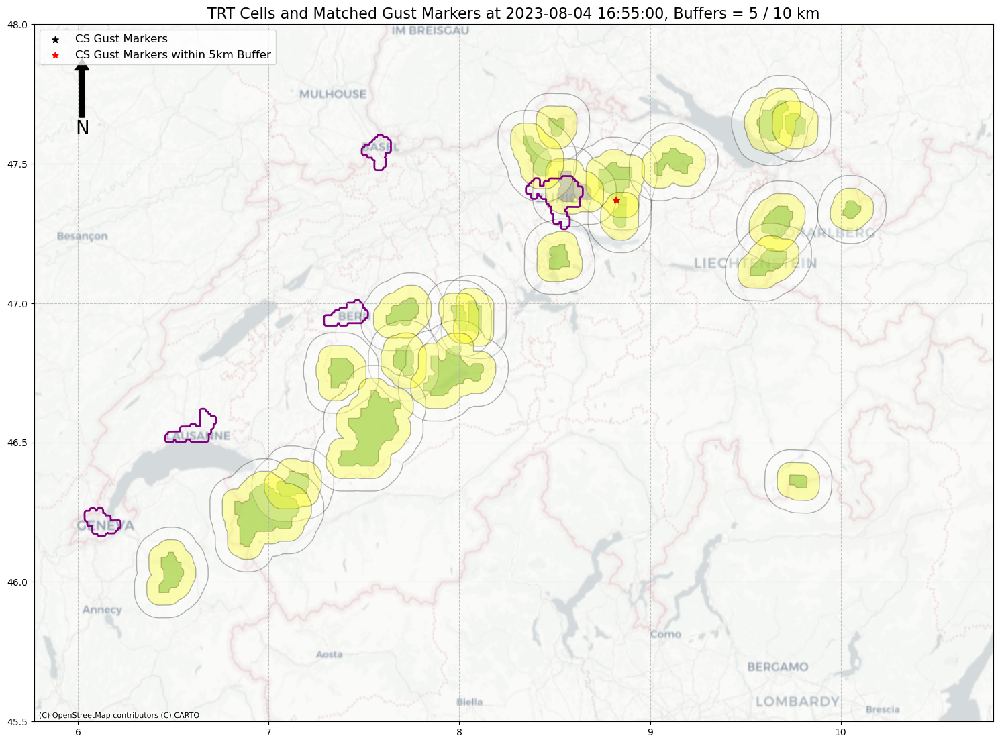

In [107]:
import matplotlib.pyplot as plt
import contextily as ctx
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# Set the figure size
fig, ax = plt.subplots(figsize=(15, 15))


# Set the spatial extent
extent = extent_switzerland
#extent = Zurich_extent
ax.set_xlim(extent[0], extent[1])
ax.set_ylim(extent[2], extent[3])

# Plot the original TRT cell geometries
#trt_gdf_with_buffer.plot(ax=ax, color='green', edgecolor='black', linewidth=1, label='TRT Cells', alpha=0.5)

# Convert trt_df to GeoDataFrame
trt_gdf_new = gpd.GeoDataFrame(trt_df, geometry='geometry')

# Plot the TRT cells with conditional coloring
trt_gdf_new.plot(ax=ax, color=trt_gdf_new['Gust_Flag'].map({'Yes': 'red', '-': 'green', 'No': 'blue'}), 
             edgecolor='black', linewidth=1, label='TRT Cells', alpha=0.5)

# Plot the buffer geometries
trt_gdf_buffer.plot(ax=ax, column='buffer_geometry', color='white', alpha=0.3, label='10km Buffer', edgecolor='black')

# Plot the buffer geometries
trt_gdf_small_buffer.plot(ax=ax, column='buffer_geometry', color='yellow', alpha=0.3, label='5km Buffer', edgecolor='black')

# Plot CS gust markers if not empty
if not gust_gdf_cs.empty:
    gust_gdf_cs.plot(ax=ax, color='black', markersize=50, label='CS Gust Markers', marker='*')

# Plot STA gust markers if not empty
if not gust_gdf_sta.empty:
    gust_gdf_sta.plot(ax=ax, color='black', markersize=40, label='STA Gust Markers', marker='o')

# Plot STA gust markers if not empty
if not gust_gdf_eswd.empty:
    gust_gdf_eswd.plot(ax=ax, color='black', markersize=40, label='ESWD Gust Markers', marker='s')

# Plot matched CS gust markers if not empty
if not matched_gusts_cs.empty:
    matched_gusts_cs.plot(ax=ax, color='red', markersize=50, label='CS Gust Markers within 5km Buffer', marker='*')

# Plot matched STA gust markers if not empty
if not matched_gusts_sta.empty:
    matched_gusts_sta.plot(ax=ax, color='blue', markersize=40, label='STA Gust Markers within 10km Buffer', marker='o')

# Plot matched STA gust markers if not empty
if not matched_gusts_eswd.empty:
    matched_gusts_eswd.plot(ax=ax, color='orange', markersize=40, label='ESWD Gust Markers within 10km Buffer', marker='s')


# Plot the Zurich polygon
#zurich_gdf.plot(ax=ax, facecolor='none', edgecolor='purple', linewidth=2, label='Zurich Area')

swiss_cities_gdf.plot(ax=ax, facecolor='none', edgecolor='purple', linewidth=2, label='Dense Area')

# Add a basemap
ctx.add_basemap(ax, crs=trt_gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)

# Add title and legend
plt.title(f"TRT Cells and Matched Gust Markers at {target_datetime}, Buffers = 5 / 10 km", fontsize=16)
plt.legend(loc='upper left', fontsize=12)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

# Add north arrow
x, y, arrow_length = 0.05, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

# Show the plot
plt.tight_layout()

#plt.savefig("/users/fackerma/newproject1/figures/negative_cases/Gust_Markers/2_" + day + '_' + valid_time3 + "_10km_spatprio_.png", dpi=300, bbox_inches='tight')


In [40]:
trt_gdf

,traj_ID,time,lon,lat,chx,chy,geometry
0,2.019061e+15,2.019061e+11,10.8288,47.9540,853180.278932,316981.838552,"POLYGON ((10.5002 48.2197, 10.4986 48.1928, 10..."
1,2.019061e+15,2.019061e+11,10.7115,47.8355,844975.244838,303443.470627,"POLYGON ((10.6941 47.8725, 10.6802 47.8639, 10..."
2,2.019061e+15,2.019061e+11,8.1185,47.4299,651294.094885,253455.141120,"POLYGON ((8.083 47.5564, 8.0829 47.5474, 8.042..."
3,2.019061e+15,2.019061e+11,8.1378,47.2779,652900.622269,236569.000532,"POLYGON ((8.0801 47.3136, 8.0797 47.2866, 8.06..."
4,2.019061e+15,2.019061e+11,6.2621,46.2744,509309.119825,125456.933835,"POLYGON ((6.21 46.3912, 6.2102 46.3822, 6.1591..."
5,2.019061e+15,2.019061e+11,8.1828,45.7092,657958.073280,62217.793073,"POLYGON ((8.1782 45.8017, 8.178 45.7927, 8.165..."
6,2.019061e+15,2.019061e+11,7.8651,45.5336,633320.143395,42511.480517,"POLYGON ((7.9069 45.6593, 7.894 45.6503, 7.881..."
7,2.019061e+15,2.019061e+11,8.1095,45.5534,652397.177817,44846.084870,"POLYGON ((8.0727 45.5775, 8.0598 45.5686, 8.05..."
8,2.019061e+15,2.019061e+11,6.6645,45.3134,539269.914506,18240.015324,"POLYGON ((6.6283 45.3695, 6.6285 45.3605, 6.61..."
9,2.019061e+15,2.019061e+11,6.4499,45.3051,522424.463000,17506.724914,"POLYGON ((6.45 45.35, 6.4374 45.3409, 6.3992 4..."


## Final Processing Loop

In [ ]:
# Flagging with negative, spatial prio and 5 / 10 km Buffer

import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point
import os
import datetime
from datetime import datetime, timedelta

# Define TRT reading function
def read_TRT(path, file=0, ttime=0):
    """
    Read .trt or .json file containing TRT output
    Returns dataframe with attributes and gridded TRT cells

    Parameters
    ----------

    path : string
        path, where to look for files.
    file: string
        filename
    ttime : string
        timestep to find files for.
    Requires either filename or timestep
   
    Returns
    -------
    trt_df : dataframe
        TRT cells and attributes of the timestep.
    cells: list
        Gridded TRT cells per timestep
    timelist: list
        timesteps

    """
   
    o_x=255000
    o_y=-160000
    lx=710; ly=640
    cells=np.zeros([ly,lx])
    if file == 0:
        file=glob.glob(path["lomdata"]+'*'+ttime+'*json*')
        if len(file)>0: flag=1
        else:
            file=glob.glob(path["lomdata"]+'*'+ttime+'*'+'.trt')[0]
            flag=0
    else:
        if 'json' in file: flag=1; ttime=file[-20:-11]
        else: flag=0; ttime=file[-15:-6]
        file=[file]
   
    if flag==1:
        with open(file[0]) as f: gj = geojson.FeatureCollection(gs.load(f))
        trt_df=geopandas.GeoDataFrame.from_features(gj['features'])
        if len(trt_df)>0:
          # print(trt_df.lon.values.astype(float))
          chx, chy = c_transform(trt_df.lon.values.astype(float),trt_df.lat.values.astype(float))
          trt_df['chx']=chx.astype(str); trt_df['chy']=chy.astype(str)
          for n in range(len(trt_df)):
              lon,lat=trt_df.iloc[n].geometry.boundary.xy
              # print(trt_df.iloc[n])
              chx, chy = c_transform(lon,lat)
              # trt_df.iloc[n]['chx']=chx.astype(str); trt_df.iloc[n]['chy']=chy.astype(str)
              #transform.c_transform(trt_df.iloc[n].lon.values,trt_df.iloc[n].lat.values)
              ix=np.round((chx-o_x)/1000).astype(int)
              iy=np.round((chy-o_y)/1000).astype(int)
              rr, cc = polygon(iy, ix, cells.shape)
              # print(lat,lon,chx,chy,ix,iy)
              cells[rr,cc]=int(trt_df.traj_ID.iloc[n]);
        else: cells=[]
    else:
        data = pd.read_csv(file).iloc[8:]
        headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
        trt_df = pd.DataFrame()
        geometries = []  # New list to store geometries

        for n in range(len(data)):
            # ... (existing code remains the same)
            t = data.iloc[n].str.split(';', expand=True)
            trt_df.loc[n, 'traj_ID'] = int(t[0].values)
            trt_df.loc[n, 'time'] = int(t[1].values)
            trt_df.loc[n, 'lon'] = t[2].values.astype(float)
            trt_df.loc[n, 'lat'] = t[3].values.astype(float)
            chx, chy = c_transform([trt_df.loc[n, 'lon']], [trt_df.loc[n, 'lat']])
            ix = np.round((chx - o_x) / 1000).astype(int)
            if ix >= 710: ix = 709
            iy = np.round((chy - o_y) / 1000).astype(int)
            if iy >= 640: iy = 639
            n2 = 27
            #if int(ttime) >= 221520631: n2 = 82
            tt = np.array(t)[0, n2:-1]
            tt = np.reshape(tt, [int(len(tt) / 2), 2])
            trt_df.loc[n, 'chx'] = chx
            trt_df.loc[n, 'chy'] = chy
            lat = tt[:, 1].astype(float)
            lon = tt[:, 0].astype(float)
            chx, chy = c_transform(lon, lat)
            ix = np.round((chx - o_x) / 1000).astype(int)
            iy = np.round((chy - o_y) / 1000).astype(int)
            rr, cc = polygon(iy, ix, cells.shape)
            cells[rr, cc] = int(t[0].values)
            # Create polygon for this cell
            polygon_coords = list(zip(lon, lat))
            cell_polygon = Polygon(polygon_coords)
            geometries.append(cell_polygon)
        
        # Add geometry column to trt_df
        trt_df['geometry'] = geometries
    
        # Convert trt_df to GeoDataFrame
        trt_df = gpd.GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")

    timelist=[str(ttime)]
    return trt_df, [cells], timelist


import os
import zipfile
from datetime import datetime, timedelta
import pandas as pd
import geopandas as gpd
from shapely.geometry import Polygon
from geopandas import GeoDataFrame

def process_gust_markers(valid_date3, valid_time3, extraction_dir):
    # Convert date/time parameters
    date_obj = datetime.strptime(valid_date3, '%Y-%m-%d')
    year_last_two = date_obj.strftime('%y')
    day_of_year = date_obj.timetuple().tm_yday
    valid_date4 = f"{year_last_two}{day_of_year:03d}"
    valid_time4 = valid_time3 + '0'

    # Find matching TRT data file in extraction directory
    target_pattern = f"CZC{valid_date4}{valid_time4}"
    trt_data_file = next((f for f in os.listdir(extraction_dir) 
                         if f.startswith(target_pattern)), None)

    if not trt_data_file:
        return pd.DataFrame(columns=['geometry', 'CS Marker', 'STA Marker', 
                                   'ESWD Marker', 'Gust_Flag'])

    trt_data_path = extraction_dir
    
    # Read TRT data (rest of your processing logic remains the same)
    #trt_df, cells_list, timelist = read_TRT({"lomdata": trt_data_path}, ttime=valid_date4+valid_time4)

    # Attempt to read TRT data and handle errors gracefully
    try:
        trt_df, cells_list, timelist = read_TRT({"lomdata": trt_data_path}, 
                                                ttime=valid_date4+valid_time4)
    except Exception as e:
        # Log the error if needed (optional)
        print(f"Error reading TRT data: {e}")
        # Return an empty DataFrame with required columns
        return pd.DataFrame(columns=['geometry', 'CS Marker', 'STA Marker', 
                                     'ESWD Marker', 'Gust_Flag'])
    
    # Load Gust Markers dataframe
    df = pd.read_pickle("/scratch/mch/fackerma/orders/Gust_Markers/Gust_Markers_3.pkl")
        
    if trt_df.empty:
        # Return an empty DataFrame with required columns if TRT data is empty
        empty_df = pd.DataFrame(columns=['geometry', 'CS Marker', 'STA Marker', 'ESWD Marker', 'Gust_Flag'])
        trt_df = empty_df
        return trt_df
        
    # Perform your processing logic here (unchanged from your original function)
    zurich_coords = [(8.4, 47.3), (8.4, 47.45), (8.65, 47.45), (8.65, 47.3)]
    zurich_polygon = Polygon(zurich_coords)
    zurich_gdf = gpd.GeoDataFrame({'name': ['Zurich']}, geometry=[zurich_polygon], crs="EPSG:4326")

    # Alternative: Extract the larges 5 cities based on popdense > 2000 / km sqared
    file_path_swiss_cities = "largest_5_polygons_wgs84.gpkg"
    # Read the GeoPackage into a GeoDataFrame
    swiss_cities_gdf = gpd.read_file(file_path_swiss_cities)
        
    # Convert TRT DataFrame to GeoDataFrame and process buffers
    trt_gdf = GeoDataFrame(trt_df, geometry='geometry', crs="EPSG:4326")
    trt_gdf_projected = trt_gdf.to_crs(epsg=32632)
    trt_gdf_projected['buffer_geometry'] = trt_gdf_projected.geometry.buffer(10000)
    trt_gdf_with_buffer = trt_gdf_projected.to_crs(epsg=4326)
        
    # Additional processing logic remains unchanged...
        
    trt_gdf_small_buffer = trt_gdf.to_crs(epsg=32632)
    trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer.geometry.buffer(5000)
    trt_gdf_small_buffer = trt_gdf_small_buffer.to_crs(epsg=4326)
    trt_gdf_small_buffer['buffer_geometry'] = trt_gdf_small_buffer['buffer_geometry'].to_crs(epsg=4326)

    # Set up datetime for filtering
    datetime_string = f"{valid_date3} {valid_time3[:2]}:{valid_time3[2:]}:00"
    target_datetime = pd.to_datetime(datetime_string)
    time_window_cs = pd.Timedelta(minutes=2.5)
    time_window_sta = pd.Timedelta(minutes=5)
    time_window_eswd = pd.Timedelta(minutes=2.5)

    # Filter and process CS and STA data
    df_cs = df[df['Source'] == 'CS']
    df_sta = df[df['Source'] == 'STA'].copy()
    df_sta['Time'] = df_sta['Time'] - pd.Timedelta(minutes=5)
    df_eswd = df[df['Source'] == 'ESWD']

    filtered_df_cs = df_cs[(df_cs['Time'] >= target_datetime - time_window_cs) & 
                           (df_cs['Time'] <= target_datetime + time_window_cs)]
    filtered_df_sta = df_sta[(df_sta['Time'] >= target_datetime - time_window_sta) & 
                            (df_sta['Time'] <= target_datetime + time_window_sta)]
    filtered_df_eswd = df_eswd[(df_eswd['Time'] >= target_datetime - time_window_eswd) & 
                            (df_eswd['Time'] <= target_datetime + time_window_eswd)]

    # Convert to GeoDataFrames
    gust_gdf_cs = GeoDataFrame(filtered_df_cs, 
                               geometry=gpd.points_from_xy(filtered_df_cs.Longitude, filtered_df_cs.Latitude),
                               crs="EPSG:4326")
    gust_gdf_sta = GeoDataFrame(filtered_df_sta, 
                               geometry=gpd.points_from_xy(filtered_df_sta.Longitude, filtered_df_sta.Latitude),
                               crs="EPSG:4326")
    gust_gdf_eswd = GeoDataFrame(filtered_df_eswd, 
                                geometry=gpd.points_from_xy(filtered_df_eswd.Longitude, filtered_df_eswd.Latitude),
                                crs="EPSG:4326")

    # After creating trt_gdf_with_buffer:
    trt_gdf_buffer = trt_gdf_with_buffer.to_crs(epsg=4326)  # Ensure CRS matches gust_gdf_sta
    trt_gdf_buffer.set_geometry('buffer_geometry', inplace=True)
    trt_gdf_buffer['buffer_geometry'] = trt_gdf_buffer['buffer_geometry'].to_crs(epsg=4326)

    # Perform spatial joins for CS gusts
    #trt_gdf_buffer = trt_gdf_with_buffer.copy()
    #trt_gdf_buffer.set_geometry('buffer_geometry', inplace=True)
    trt_gdf_small_buffer.set_geometry('buffer_geometry', inplace=True)
        
    matched_gusts_cs = gpd.sjoin(gust_gdf_cs, trt_gdf_small_buffer, how="inner", predicate="within", rsuffix='_trt')
    matched_gusts_cs = matched_gusts_cs.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')
        
    matched_gusts_sta = gpd.sjoin(gust_gdf_sta, trt_gdf_buffer, how="inner", predicate="within", rsuffix='_trt')
    matched_gusts_sta = matched_gusts_sta.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')

    matched_gusts_eswd = gpd.sjoin(gust_gdf_eswd, trt_gdf_small_buffer, how="inner", predicate="within", rsuffix='_trt')
    matched_gusts_eswd = matched_gusts_eswd.drop_duplicates(subset=['Longitude', 'Latitude', 'Time'], keep='first')

    # For STA gusts, find the closest cell
    def find_closest_cell(gust_point, cells_gdf):
        distances = cells_gdf.geometry.distance(gust_point)
        closest_cell_index = distances.idxmin()
        return closest_cell_index, distances[closest_cell_index]

    sta_closest_cells = matched_gusts_sta.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))
    cs_closest_cells = matched_gusts_cs.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))
    eswd_closest_cells = matched_gusts_eswd.geometry.apply(lambda x: find_closest_cell(x, trt_gdf))

    sta_closest_df = pd.DataFrame(sta_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=sta_closest_cells.index)
    #sta_closest_df.drop_duplicates(subset=['traj_ID', 'distance'], inplace=True)
    cs_closest_df = pd.DataFrame(cs_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=cs_closest_cells.index)

    eswd_closest_df = pd.DataFrame(eswd_closest_cells.tolist(), columns=['traj_ID', 'distance'], index=eswd_closest_cells.index)

    cs_counts = {}
    for index, row in cs_closest_df.iterrows():
        if row['distance'] <= 5000:
            cs_counts[row['traj_ID']] = cs_counts.get(row['traj_ID'], 0) + 1

    sta_counts = {}
    for index, row in sta_closest_df.iterrows():
        if row['distance'] <= 10000:
            sta_counts[row['traj_ID']] = sta_counts.get(row['traj_ID'], 0) + 1

    eswd_counts = {}
    for index, row in eswd_closest_df.iterrows():
        if row['distance'] <= 5000:
            eswd_counts[row['traj_ID']] = eswd_counts.get(row['traj_ID'], 0) + 1

    # Update trt_df with the new counts
    trt_df['CS Marker'] = trt_df.index.map(lambda x: cs_counts.get(x, 0)).fillna(0).astype(int)
    trt_df['STA Marker'] = trt_df.index.map(lambda x: sta_counts.get(x, 0)).fillna(0).astype(int)
    trt_df['ESWD Marker'] = trt_df.index.map(lambda x: eswd_counts.get(x, 0)).fillna(0).astype(int)

    touches_zurich = trt_gdf.intersects(zurich_gdf.geometry.iloc[0])

    # Create a new geometry column in trt_gdf based on lon and lat
    trt_gdf['point_geometry'] = trt_gdf.apply(lambda row: Point(row['lon'], row['lat']), axis=1)

    # Perform the intersection check using the new point_geometry column
    touches_swiss_cities = trt_gdf['point_geometry'].apply(
        lambda point: swiss_cities_gdf.intersects(point).any()
    )
    
    # Assign 'Gust_Flag' based on conditions
    trt_df['Gust_Flag'] = np.where(
        (trt_df['CS Marker'] > 1) | (trt_df['STA Marker'] > 0) | (trt_df['ESWD Marker'] > 0),
        'Yes',
        np.where(
            (touches_swiss_cities) &
            (target_datetime.time() >= datetime.strptime("04:00:00", "%H:%M:%S").time()) &
            (target_datetime.time() <= datetime.strptime("20:00:00", "%H:%M:%S").time()) &
            (target_datetime.year in [2022, 2023]),
            'No',
            '-'
        )
    )
    
    return trt_df

In [16]:
import os
import zipfile
from datetime import datetime, timedelta

# Define the date range
start_date = datetime.strptime('2019-06-10', '%Y-%m-%d')
end_date = datetime.strptime('2019-06-10', '%Y-%m-%d')  
time_delta = timedelta(minutes=5)

# Define paths
extraction_dir = "/scratch/mch/fackerma/orders/TRT_Unzip/"
output_dir = "/scratch/mch/fackerma/orders/trt_df_testset1/"

current_date = start_date
while current_date <= end_date:
    # Prepare date parameters
    valid_date3 = current_date.strftime('%Y-%m-%d')
    date_obj = datetime.strptime(valid_date3, '%Y-%m-%d')
    year_last_two = date_obj.strftime('%y')
    day_of_year = date_obj.timetuple().tm_yday
    valid_date4 = f"{year_last_two}{day_of_year:03d}"
    
    # Define ZIP file path
    base_path = f"/store_new/mch/msrad/radar/swiss/data/{date_obj.year}/{valid_date4}/"
    zip_file_name = f"TRTC{valid_date4}.zip"
    zip_file_path = os.path.join(base_path, zip_file_name)
    
    try:
        # Unzip once per day
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(extraction_dir)
        print(f"Unzipped {zip_file_name} for daily processing")

        # Process all time steps for this day
        current_time = datetime.combine(current_date, datetime.strptime('0000', '%H%M').time())
        end_time = datetime.combine(current_date, datetime.strptime('2355', '%H%M').time())

        while current_time <= end_time:
            valid_time3 = current_time.strftime('%H%M')
            print(f"Processing for date: {valid_date3}, time: {valid_time3}")
            
            # Modified process_gust_markers now takes extraction_dir as argument
            trt_df = process_gust_markers(valid_date3, valid_time3, extraction_dir)
            
            # Save results
            filename = f'TRT_{valid_date3}_{valid_time3}.pkl'
            trt_df.to_pickle(os.path.join(output_dir, filename))
            
            current_time += time_delta

    except FileNotFoundError:
        print(f"ZIP file not found: {zip_file_path}")
        continue  # Skip to next date if file missing

    finally:
        # Cleanup after daily processing
        for file_name in os.listdir(extraction_dir):
            if file_name.startswith("CZC"):
                file_path = os.path.join(extraction_dir, file_name)
                try:
                    os.remove(file_path)
                    print(f"Deleted temporary file: {file_path}")
                except Exception as e:
                    print(f"Error deleting {file_path}: {e}")

    current_date += timedelta(days=1)

print("Processing complete for all dates and times.")


Unzipped TRTC19161.zip for daily processing
Processing for date: 2019-06-10, time: 0000


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0005
Processing for date: 2019-06-10, time: 0010


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0015
Processing for date: 2019-06-10, time: 0020


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0025
Processing for date: 2019-06-10, time: 0030


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0035
Processing for date: 2019-06-10, time: 0040


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0045
Processing for date: 2019-06-10, time: 0050


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0055
Processing for date: 2019-06-10, time: 0100


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0105
Processing for date: 2019-06-10, time: 0110


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0115
Processing for date: 2019-06-10, time: 0120


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0125
Processing for date: 2019-06-10, time: 0130


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0135
Processing for date: 2019-06-10, time: 0140


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0145
Processing for date: 2019-06-10, time: 0150


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0155
Processing for date: 2019-06-10, time: 0200


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0205
Processing for date: 2019-06-10, time: 0210


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0215
Processing for date: 2019-06-10, time: 0220


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0225
Processing for date: 2019-06-10, time: 0230


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0235
Processing for date: 2019-06-10, time: 0240


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0245
Processing for date: 2019-06-10, time: 0250


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0255
Processing for date: 2019-06-10, time: 0300


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0305
Processing for date: 2019-06-10, time: 0310


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0315
Processing for date: 2019-06-10, time: 0320


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0325


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0330
Processing for date: 2019-06-10, time: 0335


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0340
Processing for date: 2019-06-10, time: 0345


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0350
Processing for date: 2019-06-10, time: 0355


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0400


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0405
Processing for date: 2019-06-10, time: 0410


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0415
Processing for date: 2019-06-10, time: 0420


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0425
Processing for date: 2019-06-10, time: 0430


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0435
Processing for date: 2019-06-10, time: 0440


/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversi

Processing for date: 2019-06-10, time: 0445


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0450
Processing for date: 2019-06-10, time: 0455


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0500
Processing for date: 2019-06-10, time: 0505


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0510
Processing for date: 2019-06-10, time: 0515


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0520
Processing for date: 2019-06-10, time: 0525


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0530
Processing for date: 2019-06-10, time: 0535


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0540
Processing for date: 2019-06-10, time: 0545


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0550
Processing for date: 2019-06-10, time: 0555


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0600
Processing for date: 2019-06-10, time: 0605


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0610
Processing for date: 2019-06-10, time: 0615


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0620
Processing for date: 2019-06-10, time: 0625


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0630
Processing for date: 2019-06-10, time: 0635


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0640


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0645
Processing for date: 2019-06-10, time: 0650


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as p

Processing for date: 2019-06-10, time: 0655
Processing for date: 2019-06-10, time: 0700


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0705
Processing for date: 2019-06-10, time: 0710


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0715
Processing for date: 2019-06-10, time: 0720


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0725
Processing for date: 2019-06-10, time: 0730


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0735
Processing for date: 2019-06-10, time: 0740


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0745
Processing for date: 2019-06-10, time: 0750


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0755
Processing for date: 2019-06-10, time: 0800


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0805
Processing for date: 2019-06-10, time: 0810


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0815
Processing for date: 2019-06-10, time: 0820


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0825


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0830


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0835
Processing for date: 2019-06-10, time: 0840


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0845
Processing for date: 2019-06-10, time: 0850


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0855
Processing for date: 2019-06-10, time: 0900


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0905


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0910
Processing for date: 2019-06-10, time: 0915


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0920
Processing for date: 2019-06-10, time: 0925


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0930
Processing for date: 2019-06-10, time: 0935


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 0940
Processing for date: 2019-06-10, time: 0945


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0950


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 0955
Processing for date: 2019-06-10, time: 1000


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1005
Processing for date: 2019-06-10, time: 1010


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1015
Processing for date: 2019-06-10, time: 1020


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1025


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1030


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1035


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1040


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1045


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1050


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1055


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1100


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1105


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1110


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1115


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1120


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1125


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1130
Processing for date: 2019-06-10, time: 1135


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1140


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1145


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1150
Processing for date: 2019-06-10, time: 1155


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1200
Processing for date: 2019-06-10, time: 1205


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1210


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1215


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1220


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1225


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1230


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1235
Processing for date: 2019-06-10, time: 1240


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1245


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1250


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1255


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1300


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1305


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1310


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1315


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1320


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1325


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1330


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1335


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1340


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1345


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1350


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1355


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1400


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1405


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1410


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1415


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1420


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1425


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1430


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1435


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1440


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1445
Processing for date: 2019-06-10, time: 1450


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1455


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1500


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1505


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1510


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1515


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1520


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1525


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1530


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1535


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1540


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1545
Processing for date: 2019-06-10, time: 1550


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1555


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1600


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1605


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1610


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1615


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1620


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1625


/tmp/ipykernel_152974/1311455811.py:239: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = cells_gdf.geometry.distance(gust_point)
/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array

Processing for date: 2019-06-10, time: 1630


/tmp/ipykernel_152974/1311455811.py:239: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = cells_gdf.geometry.distance(gust_point)
/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array

Processing for date: 2019-06-10, time: 1635
Processing for date: 2019-06-10, time: 1640


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1645
Processing for date: 2019-06-10, time: 1650


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1655
Processing for date: 2019-06-10, time: 1700


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1705
Processing for date: 2019-06-10, time: 1710


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1715
Processing for date: 2019-06-10, time: 1720


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1725
Processing for date: 2019-06-10, time: 1730


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1735


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1740
Error reading TRT data: list index out of range
Processing for date: 2019-06-10, time: 1745
Processing for date: 2019-06-10, time: 1750


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1755
Processing for date: 2019-06-10, time: 1800


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1805
Processing for date: 2019-06-10, time: 1810


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1815
Processing for date: 2019-06-10, time: 1820


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1825
Processing for date: 2019-06-10, time: 1830


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1835


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1840
Processing for date: 2019-06-10, time: 1845


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1850
Processing for date: 2019-06-10, time: 1855


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1900
Processing for date: 2019-06-10, time: 1905


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as p

Processing for date: 2019-06-10, time: 1910
Processing for date: 2019-06-10, time: 1915


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1920
Processing for date: 2019-06-10, time: 1925


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1930
Processing for date: 2019-06-10, time: 1935


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 1940


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1945
Processing for date: 2019-06-10, time: 1950


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 1955
Processing for date: 2019-06-10, time: 2000


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2005


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2010
Processing for date: 2019-06-10, time: 2015


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2020


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2025


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2030


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2035
Processing for date: 2019-06-10, time: 2040


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2045


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2050
Processing for date: 2019-06-10, time: 2055


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2100


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2105


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2110


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2115


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2120


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2125


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2130


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2135


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2140
Processing for date: 2019-06-10, time: 2145


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2150
Processing for date: 2019-06-10, time: 2155


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2200
Processing for date: 2019-06-10, time: 2205


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2210
Processing for date: 2019-06-10, time: 2215


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2220
Processing for date: 2019-06-10, time: 2225


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2230
Processing for date: 2019-06-10, time: 2235


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2240
Processing for date: 2019-06-10, time: 2245


/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2250
Processing for date: 2019-06-10, time: 2255


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2300


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2305


/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndi

Processing for date: 2019-06-10, time: 2310


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2315
Processing for date: 2019-06-10, time: 2320


/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndi

Processing for date: 2019-06-10, time: 2325
Processing for date: 2019-06-10, time: 2330


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2335
Processing for date: 2019-06-10, time: 2340


/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cells[rr, cc] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim

Processing for date: 2019-06-10, time: 2345
Processing for date: 2019-06-10, time: 2350


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Processing for date: 2019-06-10, time: 2355


/tmp/ipykernel_152974/1311455811.py:75: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  headers = pd.read_csv(file).iloc[7:8].iloc[0][0].split()
/tmp/ipykernel_152974/1311455811.py:82: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'traj_ID'] = int(t[0].values)
/tmp/ipykernel_152974/1311455811.py:83: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trt_df.loc[n, 'time'] = int(t[1].values)
/tmp/ipykernel_152974/1311455811.py:103: DeprecationWarnin

Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916103150T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916112450T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916111000T.rdt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916106550T.rdt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916108550T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916116250T.rdt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916112150T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916106500T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916107050T.trt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916123250T.rdt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916104350T.rdt
Deleted temporary file: /scratch/mch/fackerma/orders/TRT_Unzip/CZC1916109050T.trt
Deleted temporar

## Population Density Map

Population density file successfully loaded!
Shape of the population density array: (640, 710)


/tmp/ipykernel_15731/2155831865.py:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('viridis')  # You can choose a different colormap


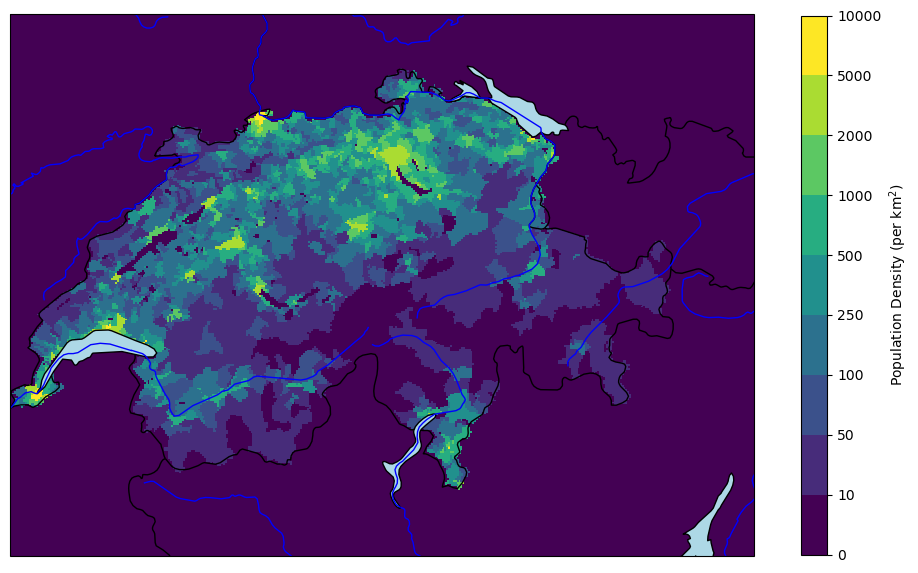

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import get_cmap

# File path to the population density array
POPULATION_DENSITY_FILE = "/users/fackerma/newproject1/Population_Density_CH_on_Radar_Grid.npy"

# Load the population density array
try:
    population_density = np.load(POPULATION_DENSITY_FILE)
    print("Population density file successfully loaded!")
    print("Shape of the population density array:", population_density.shape)
except FileNotFoundError:
    print(f"Error: Population density file not found at {POPULATION_DENSITY_FILE}")
    population_density = None
except Exception as e:
    print(f"Error loading population density file: {e}")
    population_density = None

# Plot the population density
if population_density is not None:
    # Define coordinate reference system
    projection = ccrs.epsg(3035)  # Assuming EPSG:3035

    # Create figure and axes
    fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': projection})

    # Set background colors
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    # Define colormap
    cmap = get_cmap('viridis')  # You can choose a different colormap

    # Define bounds and normalization
    bounds = [0, 10, 50, 100, 250, 500, 1000, 2000, 5000, 10000]
    norm = BoundaryNorm(bounds, cmap.N)

    # Add map features
    ax.add_feature(cfeature.COASTLINE, edgecolor='black')
    ax.add_feature(cfeature.BORDERS, edgecolor='black')
    ax.add_feature(cfeature.LAKES, facecolor='lightblue', edgecolor='black')
    ax.add_feature(cfeature.RIVERS, edgecolor='blue')


    # Assuming clons and clats range from 6, 11, 45.5, 48
    extent = [6, 11, 45.5, 48]
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    img = ax.pcolormesh(clons, clats, population_density, cmap=cmap, norm=norm, transform=projection)

    # Add colorbar
    cbar = fig.colorbar(img, ax=ax, orientation='vertical', shrink=0.7)
    cbar.set_label('Population Density (per km$^2$)')


    # Save the plot
    plt.show()

else:
    print("No population density data to visualize.")


In [30]:
import numpy as np
from shapely.geometry import Polygon
import geopandas as gpd
from pyproj import Transformer

# Create mask for high-density areas
mask = population_density > 2000
rows, cols = np.where(mask)

# Vectorized coordinate calculation for all cells meeting criteria
x_centers = X[rows, cols]  # Swiss grid X coordinates (EPSG:21781)
y_centers = Y[rows, cols]  # Swiss grid Y coordinates (EPSG:21781)

# Generate all polygon corners (5 points per cell: 4 corners + repeat first)
corner_offsets = np.array([[-500, +500], [+500, +500], [+500, -500], [-500, -500], [-500, +500]])
x_corners = x_centers[:, None] + corner_offsets[:, 0]
y_corners = y_centers[:, None] + corner_offsets[:, 1]

# Transform all corners to EPSG:3035
transformer = Transformer.from_crs(21781, 3035, always_xy=True)
flat_x = x_corners.ravel()
flat_y = y_corners.ravel()
tx, ty = transformer.transform(flat_x, flat_y)

# Reshape into individual polygons and create GeoDataFrame
polygons = [
    Polygon(np.column_stack([tx[i*5:(i+1)*5], ty[i*5:(i+1)*5]]))
    for i in range(len(rows))
]

gdf_popdense = gpd.GeoDataFrame(geometry=polygons, crs="EPSG:3035")
# Convert GeoDataFrame to WGS84 (EPSG:4326)
gdf_wgs84 = gdf_popdense.to_crs(epsg=4326)

In [ ]:
from shapely.geometry import MultiPolygon, Polygon
import geopandas as gpd

# Check the type of combined_geometry and handle accordingly
if isinstance(combined_geometry, Polygon):
    # If it's a single Polygon, create a GeoDataFrame with one row
    combined_gdf = gpd.GeoDataFrame(geometry=[combined_geometry], crs="EPSG:4326")
elif isinstance(combined_geometry, MultiPolygon):
    # If it's a MultiPolygon, iterate over its components (using .geoms)
    combined_gdf = gpd.GeoDataFrame(geometry=list(combined_geometry.geoms), crs="EPSG:4326")




                                             geometry
0   POLYGON ((6.14442 46.16751, 6.1437 46.16683, 6...
1   POLYGON ((6.22912 46.36512, 6.22827 46.3646, 6...
2   POLYGON ((6.30608 46.47187, 6.30686 46.47247, ...
3   POLYGON ((6.46133 46.5273, 6.46211 46.52789, 6...
4   POLYGON ((6.65565 46.75033, 6.65516 46.74948, ...
5   POLYGON ((6.88135 46.44578, 6.88085 46.44494, ...
6   POLYGON ((7.12614 46.7787, 7.12555 46.77791, 7...
7   POLYGON ((7.36211 46.92386, 7.36161 46.92302, ...
8   POLYGON ((7.24075 47.1096, 7.23997 47.10901, 7...
9   POLYGON ((7.58272 47.18868, 7.58351 47.18809, ...
10  POLYGON ((7.54717 47.19549, 7.54684 47.19456, ...
11  POLYGON ((7.56467 47.4762, 7.56369 47.47625, 7...
12  POLYGON ((7.63807 46.71057, 7.63783 46.70962, ...
13  POLYGON ((8.30502 47.02444, 8.30413 47.02403, ...
14  POLYGON ((8.49537 47.18721, 8.4947 47.1865, 8....
15  POLYGON ((8.52434 47.28667, 8.52375 47.28589, ...
16  POLYGON ((9.02246 45.86372, 9.02325 45.86428, ...
17  POLYGON ((8.92213 46.033

In [53]:
# Calculate the area of each polygon in square degrees (WGS84)
combined_gdf['area'] = combined_gdf.geometry.area

# Select the top 5 largest polygons based on area
largest_5_gdf = combined_gdf.nlargest(5, 'area')

# Drop the area column if you no longer need it
largest_5_gdf = largest_5_gdf.drop(columns=['area'])

# Inspect the resulting GeoDataFrame
largest_5_gdf

# Save to file if needed
#largest_5_gdf.to_file("largest_5_polygons_wgs84.gpkg", driver="GPKG")


/tmp/ipykernel_15731/2329691799.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  combined_gdf['area'] = combined_gdf.geometry.area


,geometry
15,"POLYGON ((8.52434 47.28667, 8.52375 47.28589, ..."
3,"POLYGON ((6.46133 46.5273, 6.46211 46.52789, 6..."
7,"POLYGON ((7.36211 46.92386, 7.36161 46.92302, ..."
0,"POLYGON ((6.14442 46.16751, 6.1437 46.16683, 6..."
11,"POLYGON ((7.56467 47.4762, 7.56369 47.47625, 7..."


## Check positive and negative Cases

In [3]:
import pandas as pd
import pickle
from pathlib import Path
from tqdm import tqdm

base_path = Path("/scratch/mch/fackerma/orders/TRT_processing_1/")
directories = [f"trt_processing_testorder_2020"]  # Update with actual directory names

for directory in directories:
    dir_path = base_path / directory
    yes_count = 0
    no_count = 0
    
    # Get all .pkl files (consider using generator for large collections)
    pkl_files = list(dir_path.glob("*.pkl"))
    
    for file_path in tqdm(pkl_files, desc=f"Processing {directory}"):
        try:
            with open(file_path, 'rb') as f:
                df = pickle.load(f)
                
            # Count occurrences
            counts = df['Gust_Flag'].value_counts()
            yes_count += counts.get('Yes', 0)
            no_count += counts.get('No', 0)
            
        except Exception as e:
            print(f"Error processing {file_path}: {str(e)}")
    
    print(f"\nResults for {directory}:")
    print(f"Total 'Yes': {yes_count}")
    print(f"Total 'No': {no_count}\n")


Processing trt_processing_testorder_2020: 100%|██████████| 52992/52992 [31:04<00:00, 28.42it/s]   


Results for trt_processing_testorder_2020:
Total 'Yes': 139
Total 'No': 0



In [ ]:
import os
import pandas as pd
from pathlib import Path

# Initialize list to store valid times
valid_times = []

# Base directory path
base_path = Path("/scratch/mch/fackerma/orders/TRT_processing_1/")

# Process each year directory
for year in range(2019, 2024):
    year_dir = base_path / f"trt_processing_testorder_{year}"
    
    if not year_dir.exists():
        continue

    # Process each .pkl file
    for pkl_file in year_dir.glob("TRT_*.pkl"):
        filename = pkl_file.stem
        parts = filename.split("_")
        
        if len(parts) >= 3:
            try:
                date_str = parts[1]
                time_str = parts[2]
                formatted_time = f"{date_str} {time_str[:2]}:{time_str[2:]}"
                
                df = pd.read_pickle(pkl_file)
                if 'Gust_Marker' in df.columns:
                    if df['Gust_Marker'].isin(['Yes', 'No']).any():
                        valid_times.append(formatted_time)
            except Exception as e:
                print(f"Error processing {pkl_file}: {str(e)}")

# Create and format final dataframe
result_df = pd.DataFrame({'Valid_Time': valid_times})
result_df['Valid_Time'] = pd.to_datetime(result_df['Valid_Time'])
result_df = result_df.sort_values('Valid_Time').reset_index(drop=True)
result_df['Valid_Time'] = result_df['Valid_Time'].dt.strftime('%Y-%m-%d %H:%M')

# Save to specified location
output_path = base_path.parent / "Extraction_dates.pkl"
result_df.to_pickle(output_path)
print(f"\n✅ Successfully saved {len(result_df)} entries to:\n{output_path}")

# Optional: Verify load
test_load = pd.read_pickle(output_path)
print(f"\nVerification: Loaded {len(test_load)} records from saved file")


KeyboardInterrupt: 

## Check a Ground Truth file

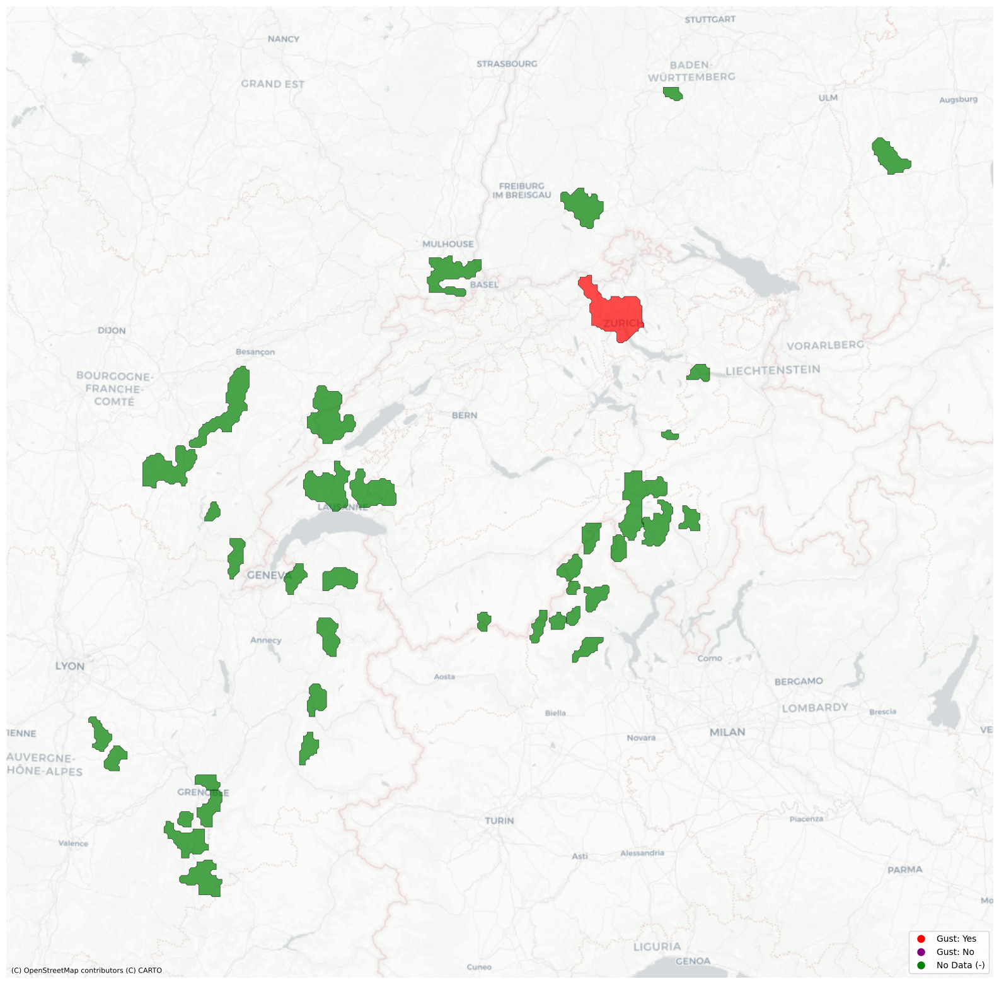

In [14]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from pathlib import Path

# Load and prepare data
file_path = Path("/scratch/mch/fackerma/orders/TRT_processing_1/trt_processing_testorder_2021/TRT_2021-07-12_2350.pkl")
df = pd.read_pickle(file_path)
gdf = gpd.GeoDataFrame(df, geometry='geometry').set_crs("EPSG:4326")

# Convert to Swiss coordinate system (EPSG:2056) for accurate positioning
gdf = gdf.to_crs("EPSG:2056")

# Create color mapping
color_mapping = {
    'Yes': 'red',
    'No': 'purple',
    '-': 'green'
}
gdf['color'] = gdf['Gust_Flag'].map(color_mapping).fillna('green')

# Create plot with dynamic bounds
fig, ax = plt.subplots(figsize=(35, 20))

# Plot all polygons at once with color mapping
gdf.plot(ax=ax, color=gdf['color'], edgecolor='black', 
         linewidth=0.5, alpha=0.7, legend=True)

# Calculate dynamic bounds with 10% buffer
minx, miny, maxx, maxy = gdf.total_bounds
delta_x = (maxx - minx) * 0.1  # 10% buffer
delta_y = (maxy - miny) * 0.1

ax.set_xlim(minx - delta_x, maxx + delta_x)
ax.set_ylim(miny - delta_y, maxy + delta_y)

# Add contextily basemap with proper zoom
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron,
                zoom=8)  # Auto-zoom based on extent

# Add map elements
ax.set_axis_off()  # Cleaner look without axis labels

# Create custom legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', label='Gust: Yes',
               markerfacecolor='red', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Gust: No',
               markerfacecolor='purple', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='No Data (-)',
               markerfacecolor='green', markersize=10)
]
ax.legend(handles=legend_elements, loc='lower right')

# Save output


In [15]:
df

,traj_ID,time,lon,lat,chx,chy,geometry,CS Marker,STA Marker,ESWD Marker,Gust_Flag
0,2.021071e+15,2.021071e+11,8.4789,47.4243,678491.841319,253130.456076,"POLYGON ((8.2963 47.6, 8.2828 47.5911, 8.243 4...",0,2,0,Yes
1,2.021071e+15,2.021071e+11,7.3528,47.6095,593546.906006,273206.310191,"POLYGON ((7.3387 47.6931, 7.3254 47.6841, 7.31...",0,0,0,-
2,2.021071e+15,2.021071e+11,5.0455,45.4418,412726.570283,35075.785555,"POLYGON ((4.9749 45.5251, 4.9625 45.5159, 4.96...",0,0,0,-
3,2.021071e+15,2.021071e+11,8.6207,46.5556,690644.833459,156717.222733,"POLYGON ((8.5825 46.689, 8.5692 46.6801, 8.53 ...",0,0,0,-
4,2.021071e+15,2.021071e+11,8.7515,46.4285,700910.559609,142749.552534,"POLYGON ((8.7491 46.5522, 8.7487 46.5342, 8.76...",0,0,0,-
5,2.021071e+15,2.021071e+11,8.2968,46.3862,666013.996022,137564.126769,"POLYGON ((8.2651 46.4488, 8.2649 46.4398, 8.25...",0,0,0,-
6,2.021071e+15,2.021071e+11,8.1627,46.2388,655849.734672,121075.145168,"POLYGON ((8.185 46.3054, 8.1719 46.2965, 8.171...",0,0,0,-
7,2.021071e+15,2.021071e+11,8.1755,46.1487,656931.025749,111068.766461,"POLYGON ((8.1574 46.1797, 8.1443 46.1708, 8.14...",0,0,0,-
8,2.021071e+15,2.021071e+11,8.1765,46.0156,657147.329336,96273.913738,"POLYGON ((8.1946 46.0625, 8.1816 46.0536, 8.16...",0,0,0,-
9,2.021071e+15,2.021071e+11,8.0704,45.9892,648953.572707,93267.525658,"POLYGON ((8.0651 46.0363, 8.065 46.0273, 8.052...",0,0,0,-


## Process the Timestamps of the Ground Truth

In [1]:
import pandas as pd
from pathlib import Path

# Define the file path
file_path = Path("/scratch/mch/fackerma/orders/Extraction_dates.pkl")

# Load the pickle file into a DataFrame
try:
    df = pd.read_pickle(file_path)
    print("Successfully loaded the DataFrame:")
    print(df.head())  # Display the first few rows of the DataFrame
except FileNotFoundError:
    print(f"Error: The file '{file_path}' does not exist.")
except Exception as e:
    print(f"An error occurred while loading the file: {e}")


Successfully loaded the DataFrame:
Empty DataFrame
Columns: [Valid_Time]
Index: []
